<a href="https://colab.research.google.com/github/Sharmariyaa/Netflix_Movies_and_TV_Shows_Clustering/blob/main/Netflix_Movies_and_TV_Shows_Clustering_ML_Capstone_Project_Riya_Sharma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  **Netflix_Movies_and_TV_Shows_Clustering**

##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Name**            - Riya Sharma

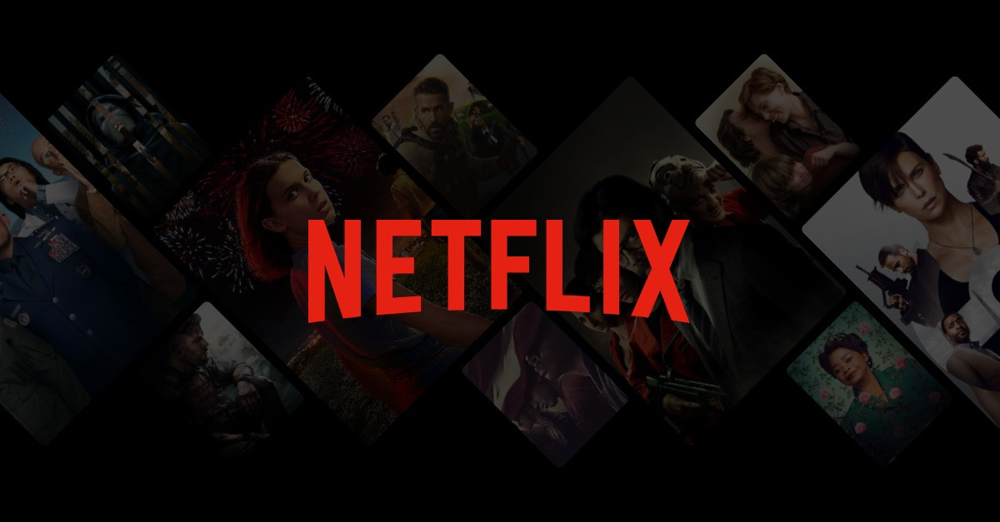

# **Project Summary -**

The headquarters of the American media business Netflix, Inc. are in Los Gatos, California. The Netflix brand is an over-the-top subscription video on-demand service that was established in 1997 by Reed Hastings and Marc Randolph in Scotts Valley, California. It offers both original movies and television shows that the company has produced or acquired as well as third-party content that has been licenced from other distributors. Almost 230 million people around the world were Netflix subscribers as of January 2023.

It might be challenging for customers to locate the movies and TV episodes they're looking for on Netflix, one of the most popular streaming services. This issue might be resolved by grouping comparable films and TV shows based on factors like genre, release year, rating, etc. **The goal of this project is to cluster related movies and TV episodes using unsupervised machine learning techniques and offer users-specific recommendations.**

**Approach:**

* The dataset had **12 attributes and around 7787 records**. To get started, we mounted the drive, **imported the required libraries, and stored the data in variables**. We separated the date added column into **days, months, and years** as the next stage in the data wrangling process.

* The next phase was **data analysis and visualisation**, where we looked at our data distribution using various plots and attempted to **draw useful conclusions from the dataset**.

* We performed **feature engineering** and **data pre-processing to prepare the data for model training**. We dealt with the null values by appropriately replacing them.
* We choose to cluster the data based on the attributes **director, cast, country, genre, rating, and description** during the preprocessing of the textual data. The stopwords and punctuation were all eliminated after choosing the attributes for clustering. We used **Wordnetlematizer to conduct Lematization** on these properties after changing their case to lowercase.

* These attributes' values underwent **tokenization, preprocessing, and vectorization** using TFIDF vectorizer. The total number of characteristics we produced through TFIDF vectorization was 10000.

* To lessen the dimensionality, we employed **Principal Component Analysis (PCA)**. With the use of the scree plot, we saw that approximately 5000 components could account for more than 90% of the variation; **as a result, the number of components was limited to 4000**.

* The **K-Means Clustering technique** was used to build the initial clusters, and 8 clusters were determined to be the ideal number. **Elbow technique and Silhouette score** analysis were used to obtain this.

* The Agglomerative clustering technique was then used to create clusters, and it was discovered that 14 clusters were the most effective number. The dendrogram was visualised to obtain this.

* The similarity matrix acquired after utilising cosine similarity was used to construct a content-based recommender system. Based on the sort of show the user viewed, this recommender system will provide them with 15 recommendations.

Overall, we used a **combination of Data Processing, Visualization, and Machine Learning Methods while working on this specific dataset**. Although it was a difficult undertaking, we were able to develop clusters and a **content-based recommender system using the proper strategy**.


# **GitHub Link -**

# **Problem Statement**

This dataset consists of TV shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

 Integrating this information with additional external datasets such as IMDB ratings and rotten tomatoes can yield a plethora of fascinating results.


 **In this project, you are required to do**

* Exploratory Data Analysis.

* We understand what type of content is available in different countries.

* Is Netflix increasingly focusing on TV rather than movies in recent years?

* Clustering similar content by matching text-based features.



# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.



# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries🔽

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import datetime as dt


# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# library used for textual data pre-processing
import string,unicodedata
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from collections import Counter

# library used for building recommandation system
from sklearn.metrics.pairwise import cosine_similarity

# library used for Clusters implementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

#Plotly visualization
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff


import warnings
warnings.filterwarnings('ignore')


%matplotlib inline
sns.set()

! pip install -U kaleido

import os
if not os.path.exists("images"):
    os.mkdir("images")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 12.6 MB/s eta 0:00:00


### Dataset Loading

In [ ]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load Dataset
path = '/content/drive/MyDrive/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv'
df=pd.read_csv(path)

### Dataset First View👁️

In [ ]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
#view the dataset from bottom
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

In [ ]:
print(f"Number of Rows = {df.shape[0]} \n Number of Columns = {df.shape[1]}") 

Number of Rows = 7787 
 Number of Columns = 12


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print(f"the total duplicate value in this datasets are {df.duplicated().sum()}")

the total duplicate value in this datasets are 0


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
null_val =df.isnull().sum()
print(null_val)

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


* 2389 nulls in 'director'
* 718 in 'cast'
* 507 in 'country'
* 10 in 'date_added'
* 7 in rating

In [ ]:
#total null values
df.isnull().sum().sum()

3631

There are 3631 null values in the dataset.

<Axes: >

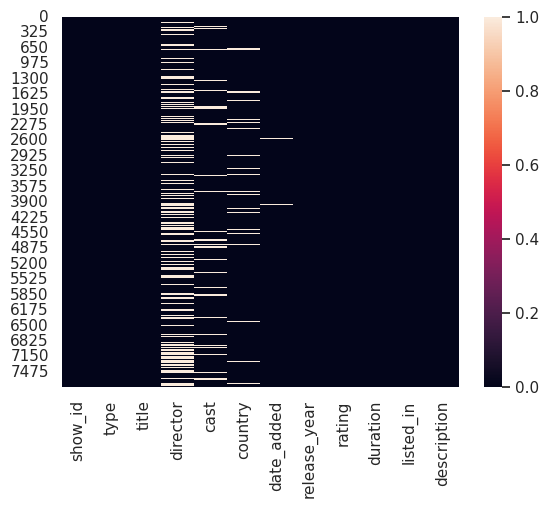

In [ ]:
#null value heatmap
sns.heatmap(df.isnull())

<BarContainer object of 12 artists>

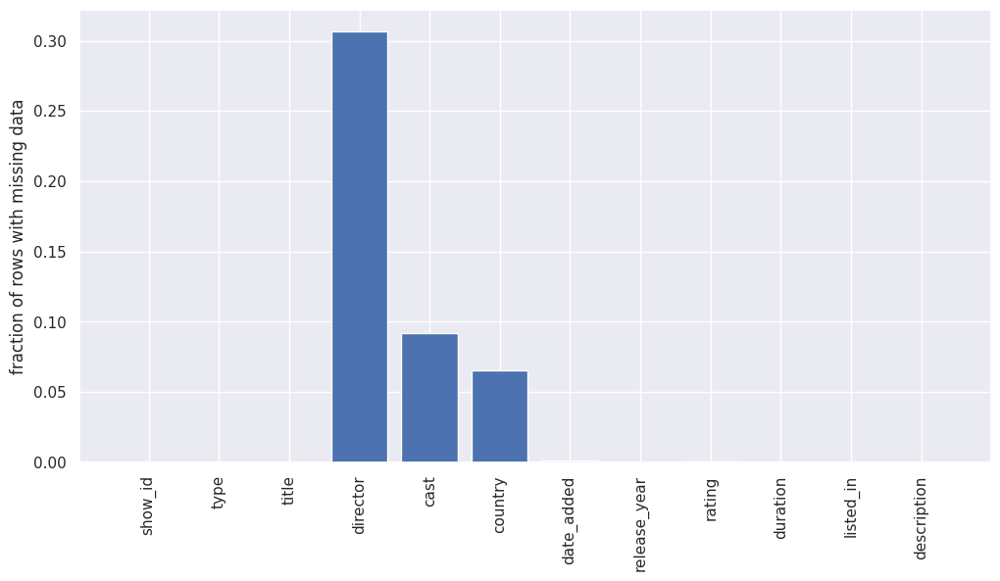

In [ ]:
# null value distribution
null_counts = df.isnull().sum()/len(df)
plt.figure(figsize=(12,6))
plt.xticks(np.arange(len(null_counts)),null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

In [ ]:
# Checking null values in percentage
for col in df.columns:
  null_rate = df[col].isnull().sum() / len(df) * 100
  if null_rate > 0:
    print(f'Percentage of null values in {col} : {null_rate}%')

Percentage of null values in director : 30.679337357133683%
Percentage of null values in cast : 9.220495697958135%
Percentage of null values in country : 6.51085141903172%
Percentage of null values in date_added : 0.1284191601386927%
Percentage of null values in rating : 0.08989341209708489%


### What did you know about your dataset?

We have 5 following features having missing values

director, cast, country, date_added, rating.

The dataset has 7787 rows and 12 columns.
'director' has the highest number of null values followed by cast, country, date_added, and rating.

Only 'release_year' is in integer dtype.

## ***2. Understanding Your Variables***

Variables and their significance are crucial to any machine learning model. As a result, the step "Understanding Your Variables" is one of the most crucial. In this kind of data exploration, we look at the numerical columns, look at the variable descriptions, and generally try to learn more about our variables and data.

In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe().T

,count,mean,std,min,25%,50%,75%,max
release_year,7787.0,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0


In [ ]:
df.describe(include = 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description 

Total we have 12 data variable and the description are as followed:

**show_id** : Unique ID for every Movie/Show

**type** : Identifier - Movie/Show

**title** : Title of the Movie/Show

**director** : Director of the Movie/Show

**cast** : Actors involved in the Movie/Show

**country** : Country where the Movie/Show was produced

**date_added** : Date it was added on Netflix

**release_year** : Actual Release year of the Movie/Show

**rating** : TV Rating of the Movie/Show

**duration** : Total Duration - in minutes or number of seasons

**listed_in** : Genre

**description**: The Summary description

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df.columns.tolist():
  print("The Unique values in",i,":",df[i].nunique())

The Unique values in show_id : 7787
The Unique values in type : 2
The Unique values in title : 7787
The Unique values in director : 4049
The Unique values in cast : 6831
The Unique values in country : 681
The Unique values in date_added : 1565
The Unique values in release_year : 73
The Unique values in rating : 14
The Unique values in duration : 216
The Unique values in listed_in : 492
The Unique values in description : 7769


## 3. ***Data Wrangling***

It entails rearranging, mapping, and transforming raw, unstructured data into a more practical format. Here, the date added column has just been broken down into days, months, and years.

### Data Wrangling Code

In [ ]:
# Handling the missing values
df[['director','cast','country']] = df[['director','cast','country']].fillna('Unknown')
df['rating'] = df['rating'].fillna(df['rating'].mode()[0])
df.dropna(axis=0, inplace = True)

In [ ]:
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

In [ ]:
df.shape

(7777, 12)

In [ ]:
# Typecasting string object to datetime object of date_added column
df['date_added']= pd.to_datetime(df['date_added'])

# Extracting date, day, month and year from date_added column
df["day_added"]= df["date_added"].dt.day
df["month_added"]= df["date_added"].dt.month
df["year_added"]= df["date_added"].dt.year

# Dropping date_added
df.drop('date_added', axis=1, inplace=True)

In [ ]:
df.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,day_added,month_added,year_added
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,14,8,2020
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,23,12,2016
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",20,12,2018
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",16,11,2017
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,1,1,2020


### What all manipulations have you done and insights you found?

The string "unknown" is used to fill in the null values in the director, cast, and nation columns. The mode value is used to fill in the null values in the rating column. Lastly, the records with null values in the "date added" column have been removed.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

Exploratory data analysis is the process of running preliminary checks on the data to look for different patterns. It aids in identifying data anomalies that are present. It is a well-defined technique to interpreting the data's story since it aids in comprehending the connections between various factors. Visualizations allow us to deduce how to handle missing values and transform variables as necessary.

#### Chart - 1 **type**

### **Content Type On Netflix:** 🎞️📺

In [ ]:
df.type.value_counts()

Movie      5377
TV Show    2400
Name: type, dtype: int64

<Axes: xlabel='type', ylabel='count'>

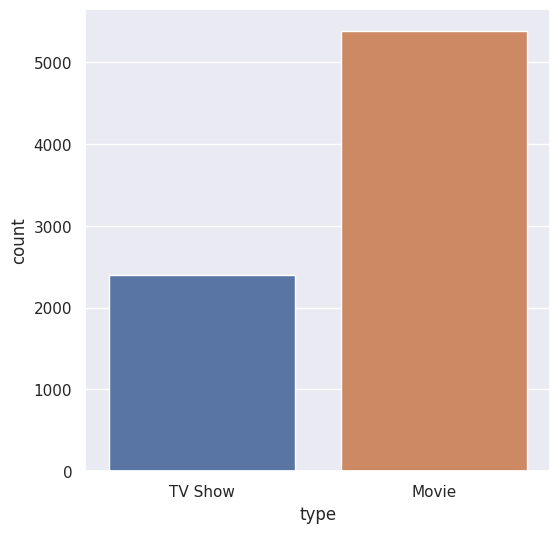

In [ ]:
plt.rcParams["figure.figsize"] = (6,6)
sns.countplot(x='type', data = df)

### **Inference:** Almost 70% of datapoints belong to Movie, rest 30% to TV Show

## Better Visualization using Plotly

In [ ]:
'''Plotly visualization .'''
import pandas as pd

import plotly.express as px

import plotly.graph_objects as go

from plotly.subplots import make_subplots

import plotly.figure_factory as ff

In [ ]:
#code for plotly visualisation
fig_donut = px.pie(df, names='type', height=300, width=600, hole=0.7,

title='Most watched on Netflix',

color_discrete_sequence=['#b20710', '#221f1f'])

fig_donut.update_traces(hovertemplate=None, textposition='outside',

textinfo='percent+label', rotation=90)

fig_donut.update_layout(margin=dict(t=60, b=30, l=0, r=0), showlegend=False,

plot_bgcolor='#333', paper_bgcolor='#333',

title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),

font=dict(size=17, color='#8a8d93'),

hoverlabel=dict(bgcolor="#444", font_size=13,

font_family="Lato, sans-serif"))
fig_donut.show(renderer='colab')

##### 1. Why did you pick the specific chart?

To know about the movie and tv shows. Like in which percent that is availabe in the type column

##### 2. What is/are the insight(s) found from the chart?

* **In our dataset we have around 69.1% content as movies and remaining 30.9% as TV shows**

* Here we have more movie as compare to TV shows

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Netflix might learn more about the kinds of media that appeal to each audience the most. With this data, choices on the acquisition and creation of material might be made. It could also be used to tailor recommendations to specific users based on their watching habits and tastes.

#### Chart - 2 
**Count plot for releases over years**

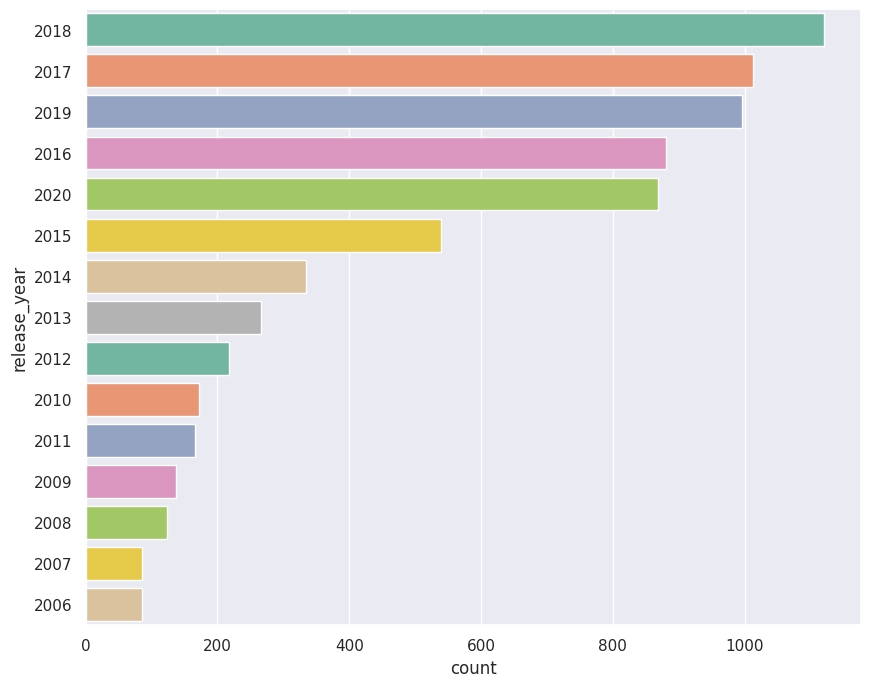

In [ ]:
plt.figure(figsize=(10,8))
sns.set(style="darkgrid")
ax = sns.countplot(y="release_year", data=df, palette="Set2", order=df['release_year'].value_counts().index[0:15])

In [ ]:
#creating two extra columns
tv_shows=df[df['type']=='TV Show']
movies=df[df['type']=='Movie']

**movies released per year**

<Axes: xlabel='count', ylabel='release_year'>

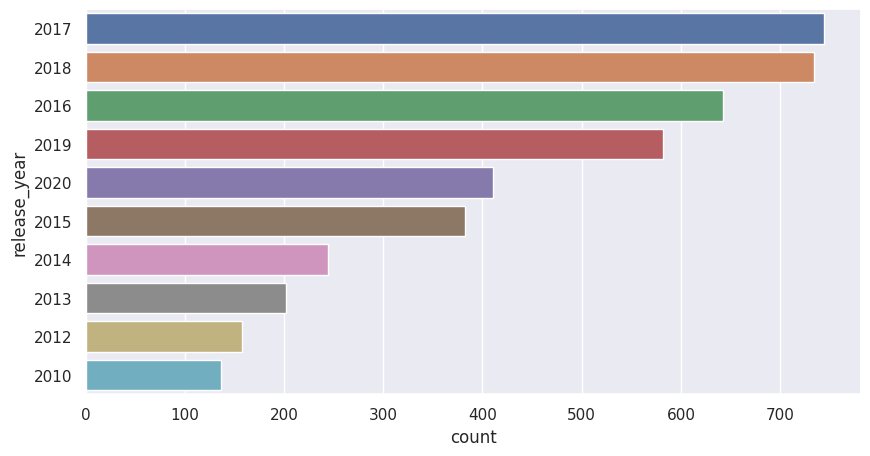

In [ ]:
#Analysing how many movies released per year in last 10 years
plt.figure(figsize=(10,5))
sns.countplot(y=movies['release_year'],data=df,order=movies['release_year'].value_counts().index[0:10])


**Tv_shows released per year**

<Axes: xlabel='count', ylabel='release_year'>

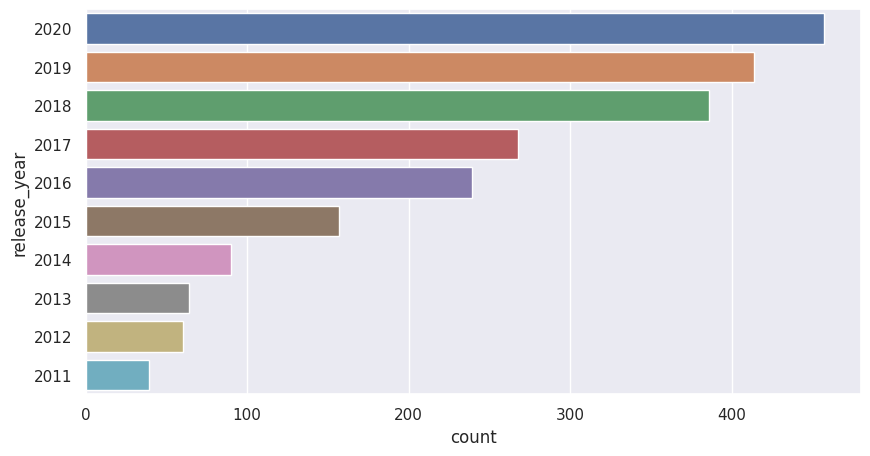

In [ ]:
#Analysing how many Tv_shows released per year in last 10 years
plt.figure(figsize=(10,5))
sns.countplot(y=tv_shows['release_year'],data=df,order=tv_shows['release_year'].value_counts().index[0:10])


In [ ]:
#better visualisation with plotly
temp_df1 = df['release_year'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['release_year'],
                marker = dict(color = 'rgb(255,165,0)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'CONTENT RELEASE OVER THE YEAR' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show(renderer='colab')

### content release over the year by content type in the last 10 years

In [ ]:
# content release over the year by content type in the last 10 years
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['year_added'].value_counts().reset_index()
temp_df2 = df2['year_added'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['year_added'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)'))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['year_added'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)'))


layout = go.Layout(template= "plotly_dark",title = 'CONTENT RELEASE OVER THE YEAR BY CONTENT TYPE IN LAST 10 YEARS' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show(renderer='colab')

##### 1. Why did you pick the specific chart?

Took this plot because to know about the 10 year release of movies and tv shows on netflix.

##### 2. What is/are the insight(s) found from the chart?

From 2015, there was a sharp rise in the number of releases, which fell in 2021 due to Covid 19. More movies are being added to Netflix than television shows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The overall rise in the number of releases after 2015 indicates that the entertainment market is expanding, maybe as a result of rising consumer desire for more material. Businesses in the sector may be able to benefit from this trend by putting money into fresh initiatives and content.

Companies in the entertainment sector should be aware of the potential implications that outside influences, like the COVID-19 pandemic, may have on their operations and make necessary plans to minimise any negative repercussions.

#### Chart - 3 Production of Several Content Categories on a Yearly Basis

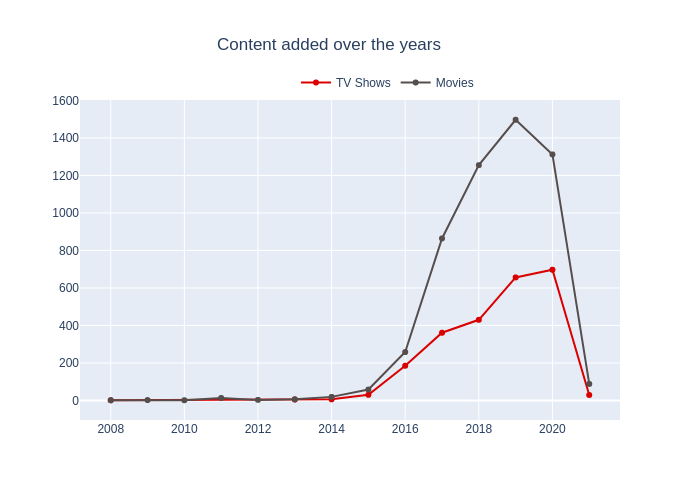

In [ ]:
# Plot growth of the contents over the years.
tv_show = df[df["type"] == "TV Show"]
movie = df[df["type"] == "Movie"]

col = "year_added"

content_1 = tv_show[col].value_counts().reset_index()
content_1 = content_1.rename(columns = {col : "count", "index" : col})
content_1 = content_1.sort_values(col)

content_2 = movie[col].value_counts().reset_index()
content_2 = content_2.rename(columns = {col : "count", "index" : col})
content_2 = content_2.sort_values(col)

trace1 = go.Scatter(x=content_1[col], y=content_1["count"], name="TV Shows", marker=dict(color="#db0000"))
trace2 = go.Scatter(x=content_2[col], y=content_2["count"], name="Movies", marker=dict(color="#564d4d"))

data = [trace1, trace2]
layout = go.Layout(title="Content added over the years",title_x=0.47, legend=dict(x=0.4, y=1.1, orientation="h"))
fig = go.Figure(data, layout=layout)

fig.write_image("images/content_added_over_year.png", scale=5)
fig.show('png')
# fig.show()

##### 1. Why did you pick the specific chart?

This line plot give the conparision with the total contents with the shows and movies per year

##### 2. What is/are the insight(s) found from the chart?

* By 2018, no of Movies has nearly trippled since 2008.
* Post 2018, production of movies are on a sharp decline but the tv shows decline after the 2020. **One of the plausible reason could be increase in watching of TV shows.**
* Post 2020, Both tv shows and movie declined because of covid 19 issues.

#### Chart - 4 **Country** wise content on netflix

In [ ]:
#count of unique column
df.country.nunique()

682

In [ ]:
# Create a dict to store counts of each country appearing in our dataset.
countries = ", ".join(df['country'].dropna()).split(", ")
countries_dict = dict(Counter(countries))
countries_dict = dict((key.lower(), value) for key, value in countries_dict.items())

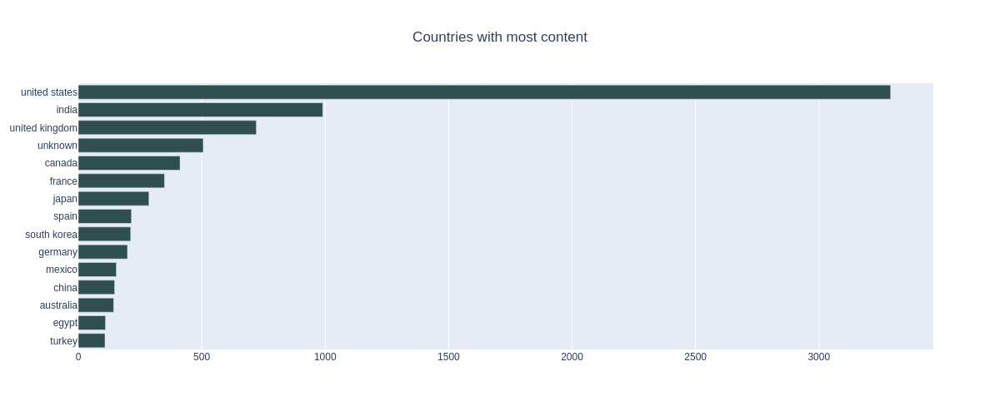

In [ ]:
# Lets find the top Fifteen countries that produce most of the content.
top_fifteen = Counter(countries_dict).most_common(15)

country = [_[0] for _ in top_fifteen][::-1]
count = [_[1] for _ in top_fifteen][::-1]
trace1 = go.Bar(y=country, x=count, orientation="h", name="", marker=dict(color='darkslategray'))

data = [trace1]
layout = go.Layout(title="Countries with most content", title_x = 0.5, height=500, width=1200, legend=dict(x=0.5, y=1.1, orientation="h"))
fig = go.Figure(data, layout=layout)
# fig.show()
fig.show('png')  

### top15 countries with most content

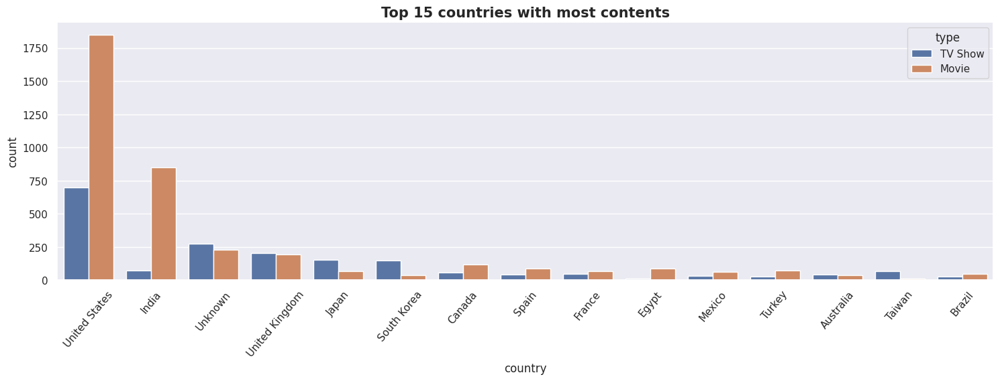

In [ ]:
#Analysing top15 countries with most content 
plt.figure(figsize=(18,5))
sns.countplot(x=df['country'],order=df['country'].value_counts().index[0:15],hue=df['type'])
plt.xticks(rotation=50)
plt.title('Top 15 countries with most contents', fontsize=15, fontweight='bold')
plt.show()

### Total Content per Country on World Map Visualisation ( Hover over to see content count on each country)

In [ ]:
# all country df
all_countries = df.groupby(['country','type']).count()['show_id'].reset_index()
all_countries.head()

,country,type,show_id
0,Argentina,Movie,34
1,Argentina,TV Show,16
2,"Argentina, Brazil, France, Poland, Germany, De...",Movie,1
3,"Argentina, Chile",Movie,1
4,"Argentina, Chile, Peru",Movie,1


In [ ]:
import re
country_count = {}
for i in range(len(all_countries)):
    l = all_countries['country'][i].split(', ')
    for x in l:
        x = re.sub('[^A-Za-z0-9 ]+', '', x)
        if x not in country_count.keys():
            country_count[x] = all_countries['show_id'][i]
        else:
            country_count[x] += all_countries['show_id'][i]
country_df = pd.DataFrame(list(zip(country_count.keys(), country_count.values())), columns =['country', 'count']) 

d = country_df.sort_values(by=['count'], ascending=False).head(10)

In [ ]:
#total content per country
sns.set_theme()
trace = go.Choropleth(
            locations = list(country_count.keys()),
            locationmode='country names',
            z = list(country_count.values()),
            text = country_df['country'],
#             autocolorscale =True,
            reversescale = False,
            zauto = True,
            colorscale = 'RdBu',
            marker = dict(
                line = dict(
                    color = 'rgb(0,0,0)',
                    width = 0.5)
            ),
            colorbar = dict(
                title = 'Total Content',
                tickprefix = '')
        )

data = [trace]
layout = go.Layout(
    title = 'Total content per country',
    geo = dict(
        showframe = True,
        showlakes = False,
        showcoastlines = True,
#         projection = dict(
#             type = 'natural earth'
#         )
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()

##### 1. Why did you pick the specific chart?

I chose this particular graph because it enables me to see the popularity trend of movies and TV shows in various nations.

##### 2. What is/are the insight(s) found from the chart?

The top 15 nations by Netflix content count are displayed on the graph. The most content is found in the United States, followed by India and the United Kingdom. The fact that the majority of the top nations are either English-speaking or have a sizable English-speaking population suggests that Netflix has a sizable English-speaking audience.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

With the knowledge acquired, Netflix can better understand the demands and tastes of its audience worldwide and allocate resources appropriately. The information can also assist Netflix in producing content that appeals to the preferences of its audience worldwide.

#### Chart - 5  **Directors 🤠** with most number of the movies and tv shows

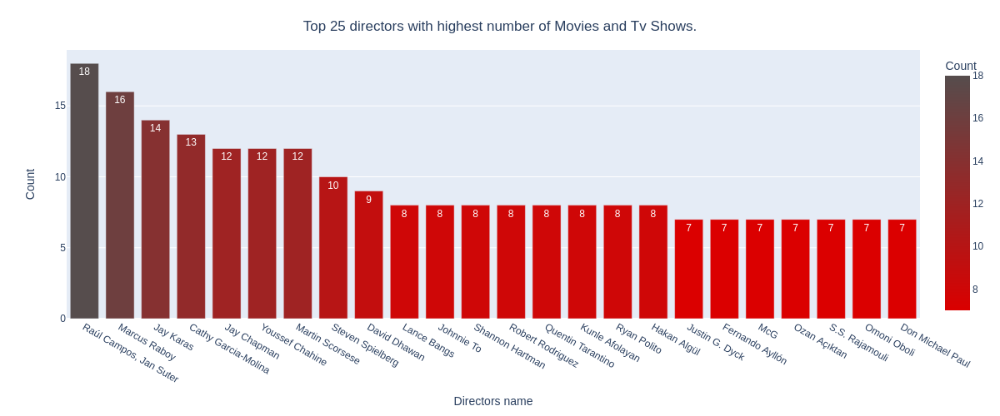

In [ ]:
directors_list = df.director.value_counts().reset_index().head(25)[1:]  # We will not include the null values.
directors_list.rename(columns={'index':'Directors name', 'director':'Count'}, inplace=True)
fig = px.bar(directors_list, x='Directors name', y='Count', text_auto=True,
             color='Count', color_continuous_scale=['#db0000', '#564d4d'])

fig.update_traces(textangle=0, cliponaxis=False)
fig.update_layout(
    title={
        'text': 'Top 25 directors with highest number of Movies and Tv Shows.',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        autosize=False,
        width=1200,
        height=500)
# fig.show()
fig.show('png')

**Top directors 🤠**  from the director column

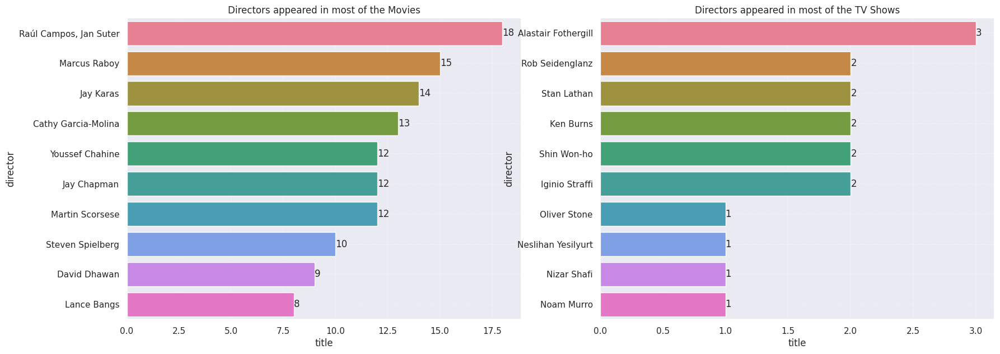

In [ ]:
# Chart - 5 visualization code
plt.figure(figsize=(20,7))
for i,j,k in ((df[df['type']== 'Movie'], 'Movies',0),(df[df['type']== 'TV Show'], 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_director = i.groupby(['director']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[1:11]
  plots= sns.barplot(y = "director",x = 'title', data = df_director, palette='husl')
  plt.title(f'Directors appeared in most of the {j}')
  plt.grid(linestyle='--', linewidth=0.3)
  plots.bar_label(plots.containers[0])
plt.show()

##### 1. Why did you pick the specific chart?

Here we took the seaborn bar plot in the tv shows and movie to check the which director is high

##### 2. What is/are the insight(s) found from the chart?

* The most films (15) by Marcus Raboy are currently available on Netflix. Jay Karas (14) and Cathy Garcia-Molina follow him in the order (13).
* Rob Seidenglanz, Ken Burns, and a few others have directed the majority of TV shows in the category (2). Pantham Thongsang, Cheewatan Pusitsuksa, and others perform one show after them.

#### Chart - 6 **TOP Genres** check top 20 generes in netflix df

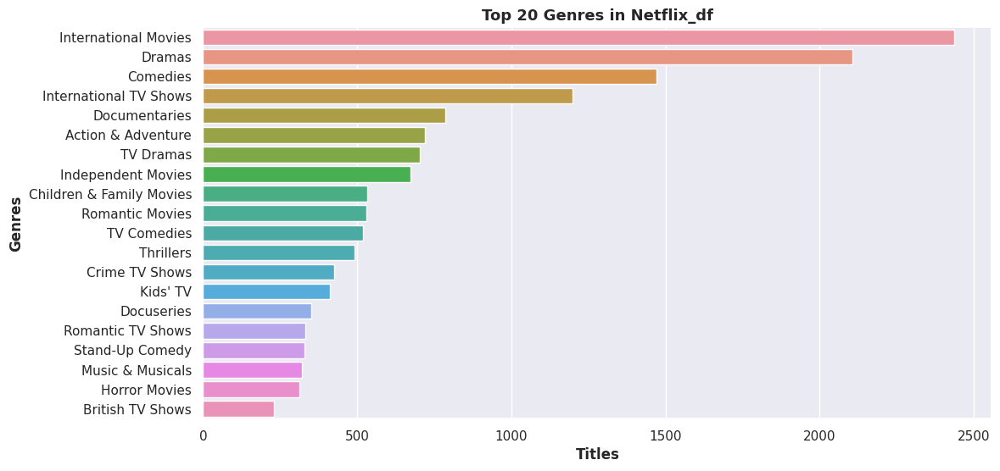

In [ ]:
# Chart - 6 visualization code

# Analysing top 20 genres on Netflix
most_genres = df.set_index('title').listed_in.str.split(', ', expand=True).stack().reset_index(level=1, drop=True);
plt.figure(figsize=(12,6))
genres = sns.countplot(y = most_genres, order=most_genres.value_counts().index[:20])
plt.title('Top 20 Genres in Netflix_df',fontsize='13',fontweight='bold')
plt.xlabel('Titles',fontweight='bold')
plt.ylabel('Genres',fontweight='bold')
plt.show()

In [ ]:
#creating two extra columns
tv_shows=df[df['type']=='TV Show']
movies=df[df['type']=='Movie']

<Axes: title={'center': 'Top10 Genre of Movies'}, xlabel='count', ylabel='listed_in'>

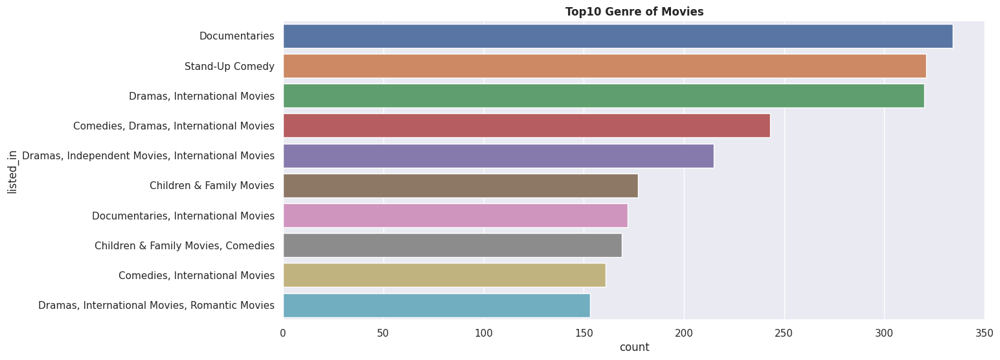

In [ ]:
#Analysing top10 genre of the movies
plt.figure(figsize=(14,6))
plt.title('Top10 Genre of Movies',fontweight="bold")
sns.countplot(y=movies['listed_in'],data=movies,order=movies['listed_in'].value_counts().index[0:10])

<Axes: title={'center': 'Top10 Genre of TV Shows'}, xlabel='count', ylabel='listed_in'>

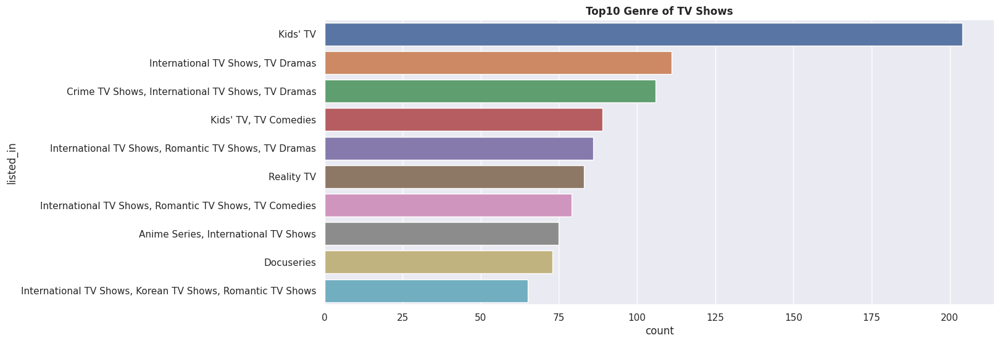

In [ ]:
#Analysing top10 genres of TVSHOWS
plt.figure(figsize=(14,6))
plt.title('Top10 Genre of TV Shows',fontweight="bold")
sns.countplot(y=tv_shows['listed_in'],data=tv_shows,order=tv_shows['listed_in'].value_counts().index[0:10])

##### 1. Why did you pick the specific chart?

To see an overview of the top 20 Netflix genres by the number of titles and top 10 genres for both movies and TV shows.

##### 2. What is/are the insight(s) found from the chart?

* The top 20 genres by number of titles are displayed in the graph above (for both movies and TV shows).
* We can see from the graph above that Dramma and Comedies are ranked behind Foreign movies in order of popularity.
So, we may conclude that Netflix's Foreign Cinema category is the most well-known.
* Documentaries are the top most genre in netflix which is fllowed by standup comedy and Drams and international movies.
* kids tv is the top most TV show genre in netflix.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

* Certainly, the learned insights will contribute to successful company outcomes.

* There are no insights that result in negative growth.

#### Chart - 7 **TOP actors 🎭**

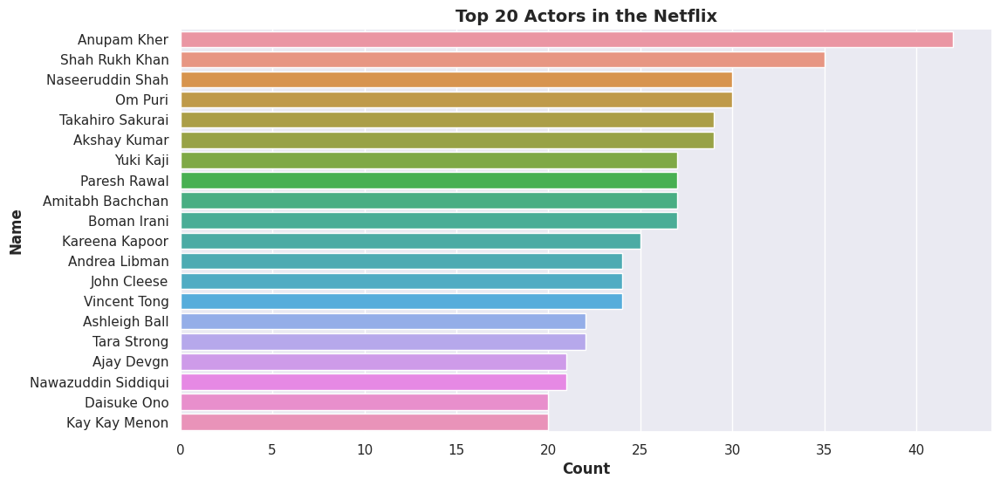

In [ ]:
# Chart - 7 visualization the top 20 actor from the netflix df

top_actor = df.set_index('title').cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True);
plt.figure(figsize=(12,6))
actors = sns.countplot(y = top_actor, order=top_actor.value_counts().index[1:21])
plt.title('Top 20 Actors in the Netflix',fontsize='14',fontweight='bold')
plt.xlabel('Count',fontweight='bold')
plt.ylabel('Name',fontweight='bold')
plt.show()

##### 1. Why did you pick the specific chart?

I chose this particular graph to visualise the top 10 actors according to the number of titles (for both TV shows and Movies)

##### 2. What is/are the insight(s) found from the chart?

* The top 10 actors by number of titles are displayed in the graph above (for both movies and TV shows).
* We can see from the above bar graph that Anupam Kher is in the lead, followed by Shah Rukh Khan and Om Puri. Anupam Kher is the best actor on Netflix as a result.

#### Chart - 8 **How many new movies and TV shows are uploaded to Netflix each year?**.

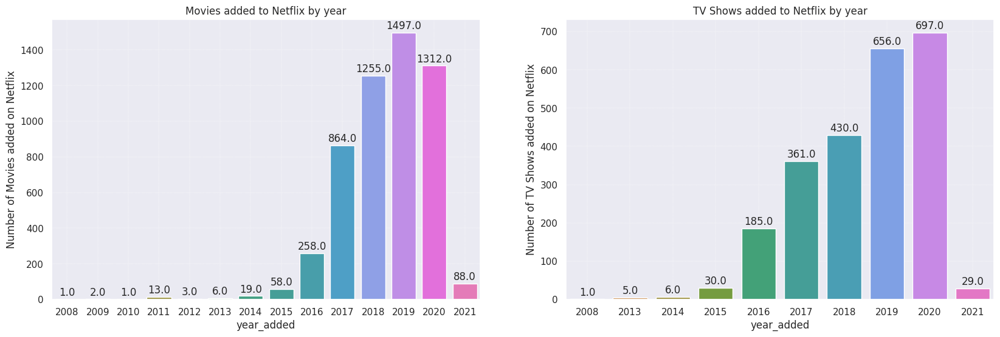

In [ ]:
plt.figure(figsize=(20,6))
for i,j,k in ((movies, 'Movies',0),(tv_shows, 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_country = i.groupby(['year_added']).agg({'title':'nunique'}).reset_index().sort_values(by=['year_added'],ascending=False)
  plots= sns.barplot(x = 'year_added',y= 'title', data = df_country, palette='husl')
  plt.title(f'{j} added to Netflix by year')
  plt.ylabel(f"Number of {j} added on Netflix")
  plt.grid(linestyle='--', linewidth=0.3)

  for bar in plots.patches:
     plots.annotate(bar.get_height(),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=12, xytext=(0, 8),
                    textcoords='offset points')
plt.show()

##### 1. Why did you pick the specific chart?

This graph displays the number of Netflix movies and TV shows that are added each year.

##### 2. What is/are the insight(s) found from the chart?

We can see that Netflix has been rapidly adding more movies and television episodes each year. In terms of new movies and TV shows, there were significantly less movies added in 2020 compared to 2019 and more TV shows added compared to that year.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Knowing that fewer movies have been added since 2018 while more TV shows have been added than ever before raises the possibility of Netflix seeing negative growth. This may be the result of a number of factors, including shifting consumer preferences, greater competition from alternative streaming services, and rising production costs for films.

Netflix may look into ways to broaden its content selection and adjust to shifting consumer preferences in order to lessen the potential damage. This can entail making investments in a variety of motion pictures, television programmes, and other kinds of original material, like documentaries, short-form series, and stand-up comedy specials. Netflix can reach a larger audience and stay relevant in the ever-changing streaming market by broadening the content it offers.

#### Chart - 9 **In which month do most movies and tv shows get added?🗓️**

In [ ]:
# Create dataframe to store manth values and counts.
months_df = pd.DataFrame(df.month_added.value_counts())
months_df.reset_index(inplace=True)
months_df.rename(columns={'index':'month', 'month_added':'count'}, inplace=True)

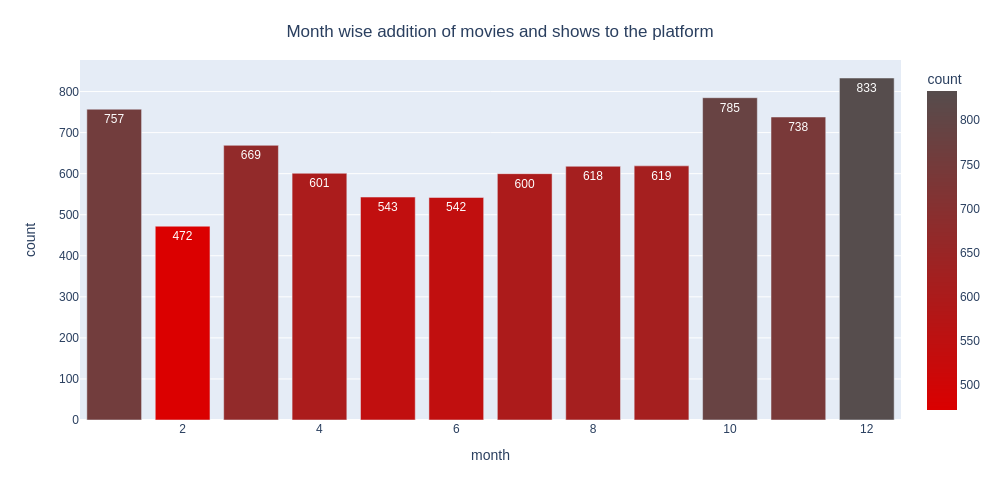

In [ ]:
fig = px.bar(months_df, x="month", y="count", text_auto=True, color='count', color_continuous_scale=['#db0000', '#564d4d'])
fig.update_layout(
    title={
        'text': 'Month wise addition of movies and shows to the platform',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        autosize=False,
        width=1000,
        height=500)
# fig.show()
fig.show('png')

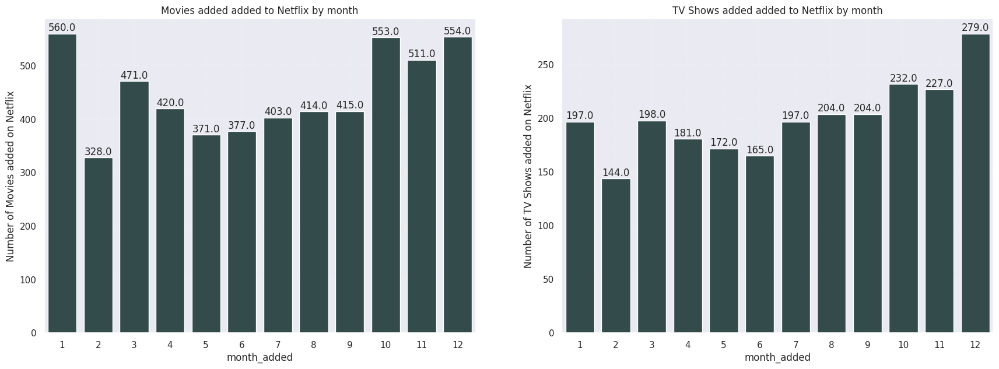

In [ ]:
# Chart - 9 visualization code

plt.figure(figsize=(21,7))
for i,j,k in ((movie, 'Movies',0),(tv_shows, 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_monthly = i.groupby(['month_added']).agg({'title':'nunique'}).reset_index().sort_values(by=['month_added'],ascending=False)
  plots= sns.barplot(x = 'month_added',y='title', data = df_monthly, color ='darkslategray')
  plt.title(f'{j} added added to Netflix by month')
  plt.ylabel(f"Number of {j} added on Netflix")
  plt.grid(linestyle='--', linewidth=0.2)
  for bar in plots.patches:
     plots.annotate(bar.get_height(),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=12, xytext=(0, 7),
                    textcoords='offset points')
plt.show()

### **Which days are more prominent?** 🦄

In [ ]:
# Create dataframe to store day values and count.
days_df = pd.DataFrame(df.day_added.value_counts())
days_df.reset_index(inplace=True)
days_df.rename(columns={'index':'day', 'day_added':'count'}, inplace=True)

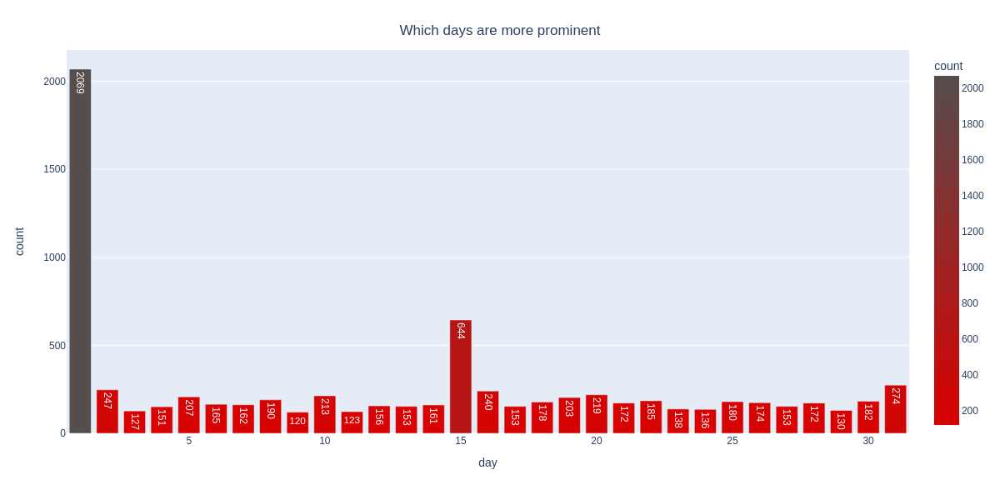

In [ ]:
fig = px.bar(days_df, x="day", y="count", text_auto=True, color='count', color_continuous_scale=['#db0000', '#564d4d'])
fig.update_layout(
    title={
        'text': 'Which days are more prominent',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        autosize=False,
        width=1200,
        height=600)
# fig.show()
fig.show('png')

##### 1. Why did you pick the specific chart?

This graph was created to demonstrate which month added the most movies and TV shows, as well as which year added the least and Which days are more prominent in a month.

##### 2. What is/are the insight(s) found from the chart?

The most popular months for new TV show additions, according to our research, are October, November, and December.

The three months with the highest number of movie additions are January, October, and November.

The least popular month for new Netflix additions of movies and TV series is February.

Most of the content is uploaded at the beginning, middle, or the end of a month.

Which makes 1st, 15th or 31st of a month more prominent in getting new tv shows and movies.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

By determining the most well-liked months for new content additions, the insights collected can assist Netflix in having a good financial impact. This can help Netflix schedule the delivery of content during times when user engagement and retention are at their highest.

If Netflix does not maintain a steady flow of new content during this time, the knowledge that February is the least popular month for new content additions might potentially result in negative growth. In order to prevent dissatisfaction and future membership losses, Netflix must maintain its audience's interest throughout the year.

#### Chart - 10  **Rating**

### Rating Column Distribution by Pie Chart

In [ ]:
#rating column distribution by plotly
fig_donut = px.pie(df, names='rating', height=800, width=800, hole=0.6,

title='MOST OF PROGRAMME ON NETFLIX IS TV-14 & TV-MA RATED',

color_discrete_sequence=['#b20710', '#221f1f'])

fig_donut.update_traces(hovertemplate=None, textposition='outside',

textinfo='percent+label', rotation=90)

fig_donut.update_layout(margin=dict(t=80, b=10, l=0, r=0), showlegend=False,

plot_bgcolor='#333', paper_bgcolor='#333',

title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),

font=dict(size=17, color='#8a8d93'),

hoverlabel=dict(bgcolor="#444", font_size=13,

font_family="Lato, sans-serif"))
fig_donut.show(renderer='colab')

### Rating distribution by Content Type

In [ ]:
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['rating'].value_counts().reset_index()
temp_df2 = df2['rating'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['rating'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['rating'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))


layout = go.Layout(template= "plotly_dark",title = 'RATING BY CONTENT TYPE' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show(renderer='colab')

##### 1. Why did you pick the specific chart?

I chose this particular chart to examine how material (movies and TV shows) was distributed according to ratings

##### 2. What is/are the insight(s) found from the chart?

The most popular rating for both films and television programmes is TV-MA, which is followed by TV-14 and TV-PG. There aren't any TV shows with the NC-17 rating, and there aren't many NC-17-rated movies. Compared to TV shows, movies have a greater percentage of G-rated material.

#### Chart - 11 **Genre Vs Country**

In [ ]:
# Create subset of dataset with required data.
conuntryVSgenre = df[['country', 'listed_in']]

# Create a function to seperate all genres and store counts for each.
def country_wise_genre(country):
  country_genre = conuntryVSgenre[conuntryVSgenre['country'] == country]
  country_genre = ", ".join(country_genre['listed_in'].dropna()).split(", ")
  country_genre_dict = dict(Counter(country_genre))
  return country_genre_dict

# Define list of top ten countries.
country_list = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico', 'Australia']
# Create an empty dict to store values of each genre for each country.
country_wise_genre_dict = {}
# Iterate through all values in country_list.
for i in country_list:
  genre_data = country_wise_genre(i)
  country_wise_genre_dict[i] = genre_data
  country_genre_count_df = pd.DataFrame(country_wise_genre_dict).reset_index()
  country_genre_count_df.rename({'index':'Genre'}, inplace=True, axis=1)

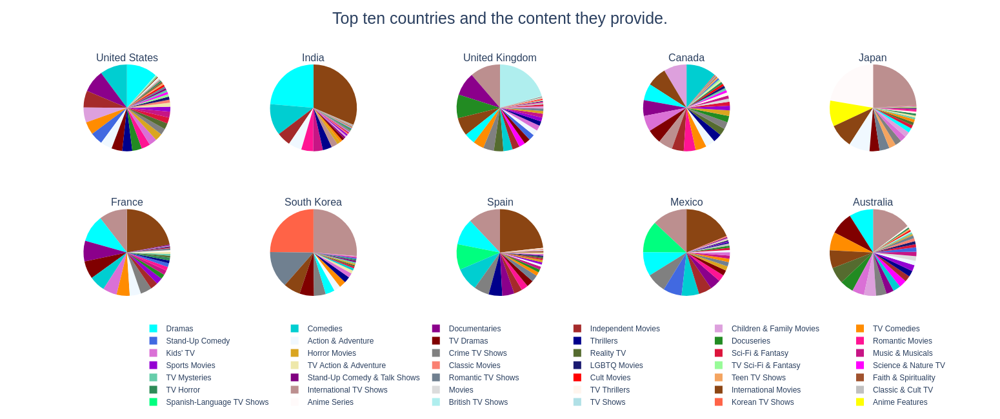

In [ ]:
# Plot the above data.
dff = country_genre_count_df

# Define colours to be used.
colors = ['aliceblue', 'brown', 'crimson', 'cyan', 'darkblue', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkturquoise', 'darkviolet', 'deeppink', 'forestgreen',
          'fuchsia', 'gainsboro', 'goldenrod', 'gray','maroon', 'mediumaquamarine', 'mediumvioletred', 'midnightblue', 'orchid', 'palegoldenrod', 'palegreen', 'paleturquoise',
          'plum', 'powderblue', 'purple', 'red', 'rosybrown', 'royalblue', 'saddlebrown', 'salmon', 'sandybrown','seagreen', 'seashell', 'sienna', 'silver', 'slategray', 'snow',
          'springgreen', 'tomato','yellow', 'yellowgreen']

# Create subplots, using 'domain' type for pie charts
specs = [[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=2, cols=5, specs=specs, subplot_titles=['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico', 'Australia'])

# Define traces. 
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['United States'], name='United States'),1,1)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['India'],  name='India'),1,2)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['United Kingdom'],  name='United Kingdom'),1,3)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['Canada'],  name='Canada'),1,4)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['Japan'],  name='Japan'),1,5)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['France'],  name='France'),2,1)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['South Korea'],  name='South Korea'),2,2)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['Spain'],  name='Spain'),2,3)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['Mexico'],  name='Mexico'),2,4)
fig.add_trace(go.Pie(labels=dff['Genre'], values=dff['Australia'],  name='Australia'),2,5)

# Tune layout and hover info
fig.update_traces(hoverinfo='label+percent+name', textinfo='none', marker=dict(colors=colors))
fig.update_layout(title={'text': 'Top ten countries and the content they provide.',
                          'y':0.97,
                          'x':0.5,
                          'font_size':25,
                          'xanchor': 'center',
                          'yanchor': 'top'},height=650, width=1550,paper_bgcolor='white',
                  legend=dict(x=0.099,orientation="h")
                          )
fig = go.Figure(fig)
# fig.show()
fig.show('png')

##### What is/are the insight(s) found from the chart?

* ***Drama, International Movies, and Comedies seem popular choices in most countries.***
* ***British and International Tv Shows dominate in the United Kingdom.***
* ***Regional specialties such as Anime in Japan and Korean Tv shows in South Korea are more prominent in these countries; This makes sense as anime has always been popular in Japan, and the rising k-pop culture explains the increase in Korean Tv Shows.***
* ***It's also observed that in the countries where the regional language is not English, International Tv Shows and Movies are more in demand.***

#### Chart - 12 **netflix Movie time Duration**

In [ ]:
#movie duration subsetting
movie['duration']=movie['duration'].str.replace(' min','')
movie['duration']=movie['duration'].astype(str).astype(int)
movie['duration']

1        93
2        78
3        80
4       123
6        95
       ... 
7781     88
7782     99
7783    111
7784     44
7786     90
Name: duration, Length: 5377, dtype: int64

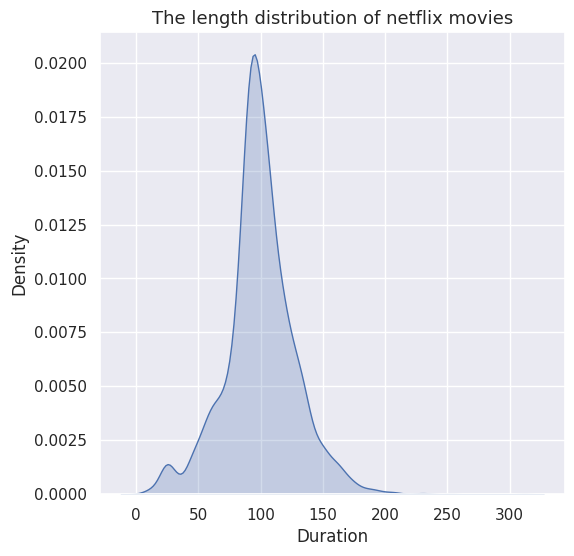

In [ ]:
#Analysis on the duration of the movies 
sns.set(style="darkgrid")
sns.kdeplot(data=movie['duration'], shade=True)
plt.title('The length distribution of netflix movies',fontsize = 13)
plt.xlabel('Duration')
plt.show()

##### 1. Why did you pick the specific chart?

To know about the movie length or duration of netflix movie

##### 2. What is/are the insight(s) found from the chart?

Most of the netflix movies are duration of 70 to 120 minutes.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

The most popular movie lengths on the site can be determined using this information. It might be feasible to find patterns and preferences that can help producers and content buyers by looking at the length of movies that Netflix users frequently watch.

Second, this data can help inform programming choices. If the majority of Netflix movies run between 90 and 120 minutes, the service should think about airing similar-length films during peak viewing hours to increase consumer engagement.



#### Chart - 13  **netflix TV Shows Duration**

<Axes: title={'center': 'Distribution of TV Shows duration'}, xlabel='duration', ylabel='count'>

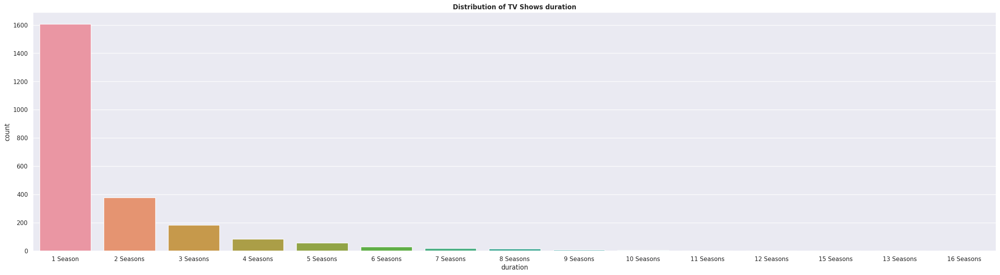

In [ ]:
#Checking the distribution of TV SHOWS
plt.figure(figsize=(32,8))
plt.title("Distribution of TV Shows duration",fontweight='bold')
sns.countplot(x=tv_shows['duration'],data=tv_shows,order = tv_shows['duration'].value_counts().index)

### Duration Vs Rating

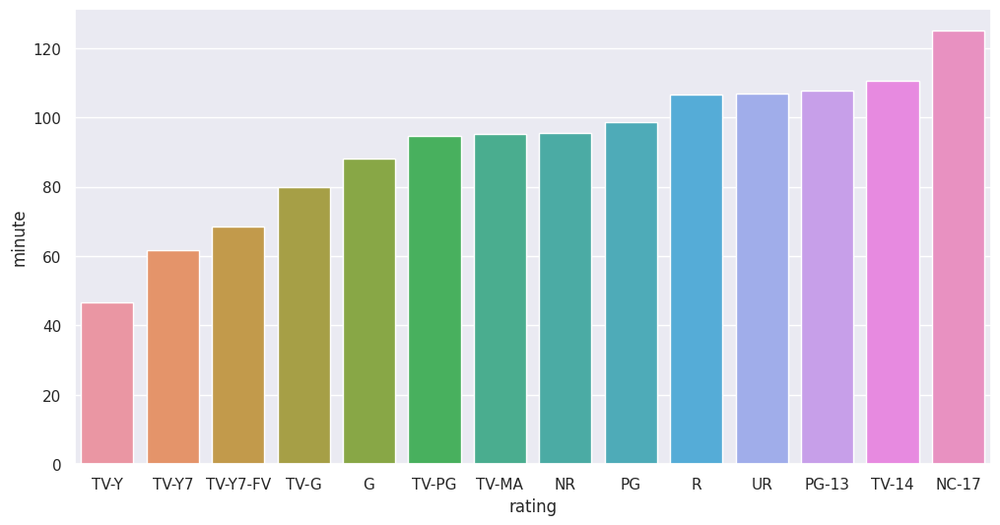

In [ ]:
movies['minute'] = movies['duration'].str.extract('(\d+)').apply(pd.to_numeric)
duration_year = movies.groupby(['rating'])['minute'].mean()
duration_df=pd.DataFrame(duration_year).sort_values('minute')
plt.figure(figsize=(12,6))
ax=sns.barplot(x=duration_df.index, y=duration_df.minute)

##### 1. Why did you pick the specific chart?

To understand about the TV- shows and movies duration.

##### 2. What is/are the insight(s) found from the chart?

* Few TV shows have more than six seasons, and most only last for two seasons.

* Only a very small number of programmes had more than 13 seasons!

* Those movies that have a rating of NC-17 have the longest average duration.

* When it comes to movies having a TV-Y rating, they have the shortest runtime on average

#### Chart - 14 - Correlation Heatmap between Target ages and country

In [ ]:
#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
df['target_ages'] = df['rating'].replace(ratings)

In [ ]:
# type should be a catego
df['type'] = pd.Categorical(df['type'])
df['target_ages'] = pd.Categorical(df['target_ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])

In [ ]:
# Preparing data for heatmap
df['count'] = 1
data = df.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']


df_heatmap = df.loc[df['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,South Korea,Spain,United Kingdom,United States,Unknown
target_ages,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008889,0.027322,0.022388,0.093434,0.073362,0.169960
Older Kids,0.225989,0.039604,0.060870,0.160347,0.271111,0.120219,0.044776,0.204545,0.187132,0.235178
Teens,0.146893,0.683168,0.165217,0.567714,0.351111,0.382514,0.097015,0.189394,0.236563,0.274704
Adults,0.446328,0.277228,0.678261,0.255688,0.368889,0.469945,0.835821,0.512626,0.502942,0.320158


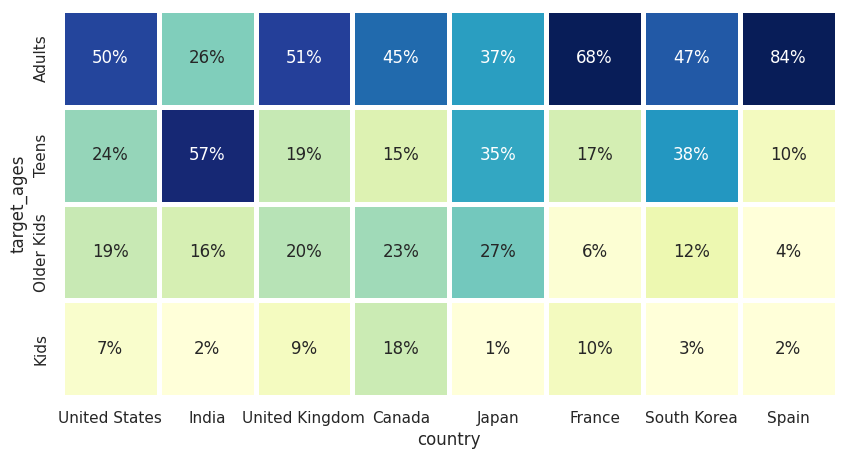

In [ ]:
# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain']
       

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order,country_order2],cmap="YlGnBu",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})
plt.show()

##### 1. Why did you pick the specific chart?

To find the correlation between Target ages and country.

##### 2. What is/are the insight(s) found from the chart?

The US and UK are closely aligned with their Netflix target ages, but radically different from, example, India or Japan!


#### Chart - 15 - Correlation Heatmap

In [ ]:
df3 = df[df.columns.difference(["count"])]


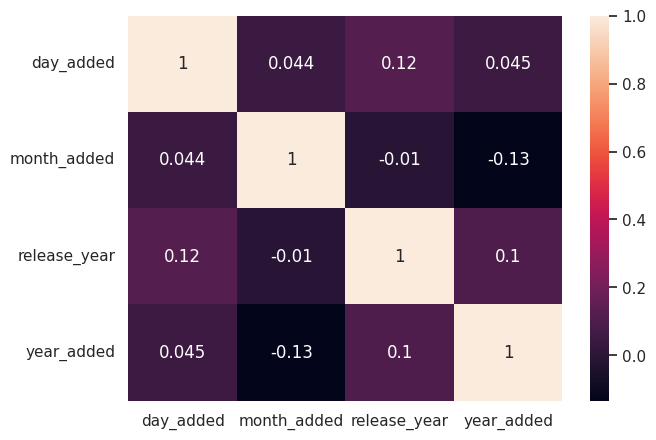

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize=(7,5))
sns.heatmap(df3.corr(),annot=True)
plt.show()

##### 1. Why did you pick the specific chart?

To check the correlation among the different features.

##### 2. What is/are the insight(s) found from the chart?

There are not any strong correlation have found among the features.

### **6. HYPOTHESIS TESTING** 

### Is Netflix has increasingly focusing on TV rather than movies in recent years?

**Hypothesis Testing to check is there is any relation between year_added and type:**

* ***Null Hypothesis:*** *year_added has no impact on type of content that gets added to the platform.*
* ***Alternative Hypothesis:*** *year_added has impact on type of content that gets added to the platform.*

***Set significance level to 0.05.***

In [ ]:
hypo_data = pd.crosstab(df['type'], df['year_added'], margins=False)
hypo_data

year_added,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
type,,,,,,,,,,,,,,
Movie,1,2,1,13,3,6,19,58,258,864,1255,1497,1312,88
TV Show,1,0,0,0,0,5,6,30,185,361,430,656,697,29


In [ ]:
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(hypo_data)

p

8.635372719955464e-11

***The p value is smaller than significance level , we will reject the null hypothesis and accept the alternative hypothesis.***

In [ ]:
# Now lets check what type of content got added in the past few years.

'''We will only check for the type of genres that got added in the years 2018-2021 for better visualization. '''

# Create subset of data with required columns.
recent_years = pd.DataFrame(df.groupby(['year_added', 'listed_in'])['listed_in'].count())
recent_years.rename(columns={'listed_in':'Count'}, inplace=True)
recent_years = recent_years.reset_index()
recent_years.drop(recent_years[recent_years.year_added < 2018].index, inplace=True)

''' There are many rows with multiple genre entries therefore we will
 create a function to split each of them and get their respective counts.'''
 
def seperate_all_genre(year):
  year_added = recent_years[recent_years['year_added'] == year]
  year_added = ", ".join(year_added['listed_in'].dropna()).split(", ")
  year_added_dict = dict(Counter(year_added))
  return year_added_dict
# Create a list of years.
yr_list = [2018,2019,2020,2021]
# Iterate through all values in yr_list.
yr_genre_count_list = {}
for i in yr_list:
  data = seperate_all_genre(i)
  yr_genre_count_list[i] = data
  yr_genre_count_df = pd.DataFrame(yr_genre_count_list).reset_index()
  yr_genre_count_df.rename({'index':'Genre'}, inplace=True, axis=1)

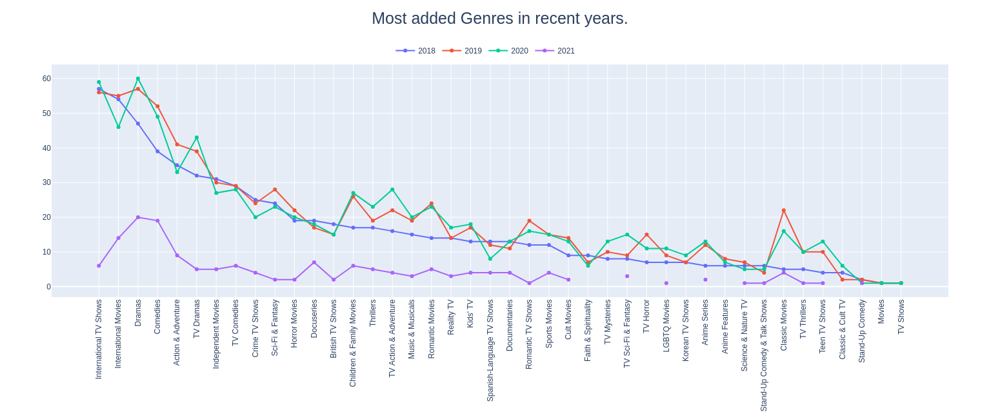

In [ ]:
# Plot the above data.
dfff = yr_genre_count_df.sort_values([2018,2019,2020,2021],ascending=False)
fig = go.Figure()
fig.add_trace(go.Scatter(y=dfff[2018], x=dfff['Genre'],
                    mode='lines+markers',
                    name=2018))
fig.add_trace(go.Scatter(y=dfff[2019], x=dfff['Genre'],
                    mode='lines+markers',
                    name=2019))
fig.add_trace(go.Scatter(y=dfff[2020], x=dfff['Genre'],
                    mode='lines+markers', 
                    name=2020))
fig.add_trace(go.Scatter(y=dfff[2021], x=dfff['Genre'],
                    mode='lines+markers', 
                    name=2021))
fig.update_xaxes(tickangle=-90)
fig.update_layout(title={'text': 'Most added Genres in recent years.',
                          'y':0.97,
                          'x':0.5,
                          'font_size':25,
                          'xanchor': 'center',
                          'yanchor': 'top'},height=650, width=1550,legend=dict(x=0.38, y=1.1, orientation="h"))

# fig.show()
fig.show('png')

* ***From the EDA we did in the beginning, we saw that there are more Movies than Tv Shows on Netflix, which might be enough to assume that Netflix focuses more on Movies than Tv Shows. But the data proves this assumption wrong.***

* ***The above line plot shows that Netflix has been adding many International Tv Shows, Tv Dramas, Tv Comedy Shows and many more tv shows in the recent years compared to Movies.***

* ***From this observation, we can say that Netflix might be shifting slowly towards Tv Shows.***

## ***7. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
# as we have already deal with null value. 
df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
release_year    0
rating          0
duration        0
listed_in       0
description     0
day_added       0
month_added     0
year_added      0
target_ages     0
count           0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7777 entries, 0 to 7786
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   show_id       7777 non-null   object  
 1   type          7777 non-null   category
 2   title         7777 non-null   object  
 3   director      7777 non-null   object  
 4   cast          7777 non-null   object  
 5   country       7777 non-null   object  
 6   release_year  7777 non-null   int64   
 7   rating        7777 non-null   object  
 8   duration      7777 non-null   object  
 9   listed_in     7777 non-null   object  
 10  description   7777 non-null   object  
 11  day_added     7777 non-null   int64   
 12  month_added   7777 non-null   int64   
 13  year_added    7777 non-null   int64   
 14  target_ages   7777 non-null   category
 15  count         7777 non-null   int64   
dtypes: category(2), int64(5), object(9)
memory usage: 926.9+ KB


### 2. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

The process of text preprocessing involves cleaning the text data and getting it ready to be fed into the model. Text data includes noise in a variety of ways, including emotions, punctuation, and case-sensitive text. We adopted the following strategy to process the data because machines cannot comprehend these concepts.

**Approach:**

* Select the attributes based on which you want to cluster the shows.
* Text preprocessing: Remove all stopwords and punctuation marks, convert all textual data to lowercase.
* Stemming to generate a meaningful word out of corpus of words.
* Tokenization of corpus and Word vectorization.
* Dimensionality reduction.

#### 1. **First we will select the attributes for clustering**

In [ ]:
#appending all text column to single text column to work with
df['filtered'] = df['description'] + ' '+ df['listed_in'] + ' ' + df['rating'] + ' '+ df['country']+ ' ' + df['cast'] + ' '+ df['director']

In [ ]:
df['filtered'][0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. International TV Shows, TV Dramas, TV Sci-Fi & Fantasy TV-MA Brazil João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi Unknown'

In [ ]:
df.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,day_added,month_added,year_added,target_ages,count,filtered
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,14,8,2020,Adults,1,In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,23,12,2016,Adults,1,After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",20,12,2018,Adults,1,"When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",16,11,2017,Teens,1,"In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,1,1,2020,Teens,1,A brilliant group of students become card-coun...


### Checking word length for different column

In [ ]:
#description len
descp_len  = [len(x) for x in df['description']]
descp_len = np.array(descp_len)

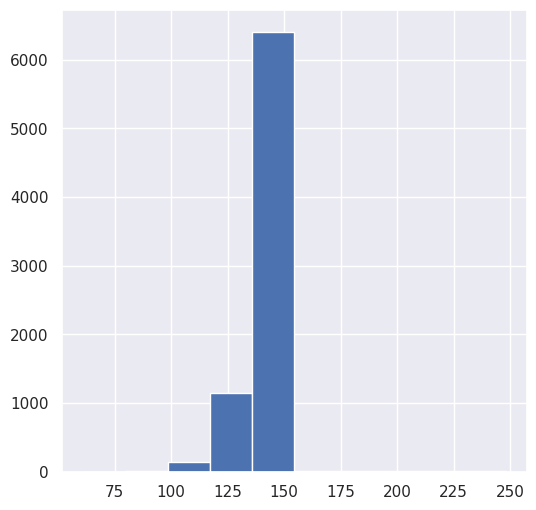

In [ ]:
plt.hist(descp_len)
plt.show()

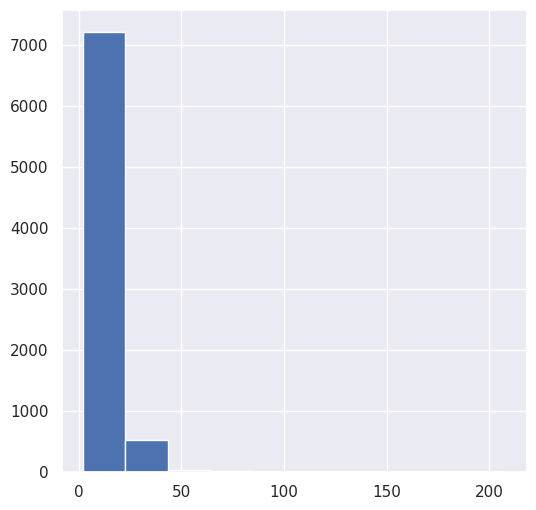

In [ ]:
# director length
dir_len  = [len(x) for x in df['director']]
dir_len = np.array(dir_len)
plt.hist(dir_len)
plt.show()

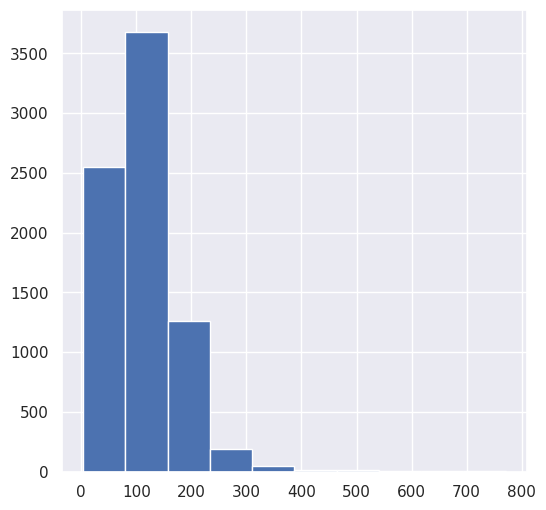

In [ ]:
#Cast length
cast_len  = [len(x) for x in df['cast']]
cast_len = np.array(cast_len)
plt.hist(cast_len)
plt.show()

In [ ]:
df['filtered']

0       In a future where the elite inhabit an island ...
1       After a devastating earthquake hits Mexico Cit...
2       When an army recruit is found dead, his fellow...
3       In a postapocalyptic world, rag-doll robots hi...
4       A brilliant group of students become card-coun...
                              ...                        
7782    When Lebanon's Civil War deprives Zozo of his ...
7783    A scrappy but poor boy worms his way into a ty...
7784    In this documentary, South African rapper Nast...
7785    Dessert wizard Adriano Zumbo looks for the nex...
7786    This documentary delves into the mystique behi...
Name: filtered, Length: 7777, dtype: object

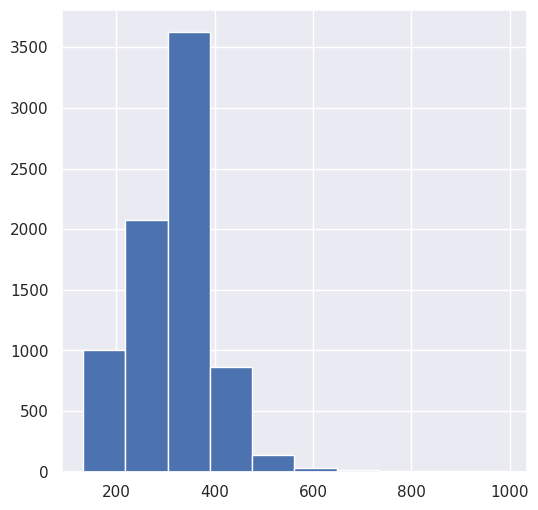

In [ ]:
#final filtered column length
fil_len  = [len(str(x)) for x in df['filtered']]
fil_len = np.array(fil_len)
plt.hist(fil_len)
plt.show()

#### 2. **Removing Stop words and Lower Casing**

In [ ]:
# Romove Stopwords

# importing nltk for extraction of stopwords
import nltk
from nltk.corpus import stopwords 
stop_words = stopwords.words('english')

# printing all the stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# Function to remove Stopwords and Lower casing

def stopwords(text):
  '''A function to removing stopwords'''
  text = [word.lower() for word in text.split() if word.lower() not in stop_words]

  return " ".join(text)


In [ ]:
# Removing the Stopwords
df['filtered'] = df['filtered'].apply(stopwords)
df['filtered'][0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor. international tv shows, tv dramas, tv sci-fi & fantasy tv-ma brazil joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschi unknown'

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations
# define the Function to remove punctuations
def remove_punctuation(text):
  '''A function for removing punctuation'''
  translator = str.maketrans('','',string.punctuation)
  return text.translate(translator)

In [ ]:
# Removing the Punctuations
df['filtered'] = df['filtered'].apply(remove_punctuation)
df['filtered'][0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor international tv shows tv dramas tv scifi  fantasy tvma brazil joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschi unknown'

#### 4.Text Normalization.

In [ ]:
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

# Function to lemmatize the corpus
def lemmatize_verbs(words):
  '''A function to lemmatize verbs in list of tokenized words'''
  lemmatizer = WordNetLemmatizer()
  lemmas = []
  for word in words:
    lemma = lemmatizer.lemmatize(word,pos='v')
    lemmas.append(lemma)
  return lemmas

In [ ]:
#Lemmatization
df['filtered'] = lemmatize_verbs(df['filtered'])
df['filtered'][0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor international tv shows tv dramas tv scifi  fantasy tvma brazil joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschi unknown'

**Which text normalization technique have you used and why?**

For text normalisation, we have employed the lemmatization technique. Lemmatization is employed when it is necessary to obtain genuine words since it produces a real word from the language.

#### 5. **Tokenization**

In [ ]:
nltk.download('omw-1.4')
from nltk.tokenize import TweetTokenizer

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
# Tokenization
tokenizer = TweetTokenizer()

In [ ]:
df['filtered'] = df['filtered'].apply(lambda x: tokenizer.tokenize(x))

#### 6. **Text Vectorization**

In [ ]:
# Vectorizing Text
# Vectorizing tokens saved in a variable
clustering_data = df['filtered']

In [ ]:
# Tokenization
def identity_tokenizer(text):
    return text

# Using TF-IDF vectorizer to vectorize the corpus 
# max features we take 10000 to prevent system from crashing

tfidf_vectorizer = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english', lowercase=False,max_features = 10000)    
tfidf_matrix  = tfidf_vectorizer.fit_transform(clustering_data) 

In [ ]:
# collect the tfidf matrix in numpy array
array = tfidf_matrix.toarray()

In [ ]:
print(array)
print(f'shape of the vector : {array.shape}')
print(f'datatype : {type(array)}')

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.19548409 0.19184557 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
shape of the vector : (7777, 10000)
datatype : <class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

The TF-IDF vectorization technique was chosen because it considers both the frequency of a word's appearance in a document and its significance to the entire corpus. So, by lowering the input dimensions, it aids in making the model-building process less complex.

##7.**Dimensionality Reduction**

**Do you think that dimensionality reduction is needed? Explain Why?**

Well, we do have text data, and using NLP approaches, we've been able to extract high-dimensional features from it. Yet, the dimensionality curse frequently strikes high-dimensional data. This phenomenon describes how the amount of data needed to train a model accurately grows exponentially as the number of dimensions rises. As a result, it is harder to analyse and visualise the data, and it is also more difficult to create models that generalise well.

### PCA for Dimensionality Reduction

In [ ]:
# using PCA to reduce dimensionality

transformer = PCA(random_state=0)
transformer.fit(array)

PCA(random_state=0)

Text(0, 0.5, 'Cumulative Explained Variance')

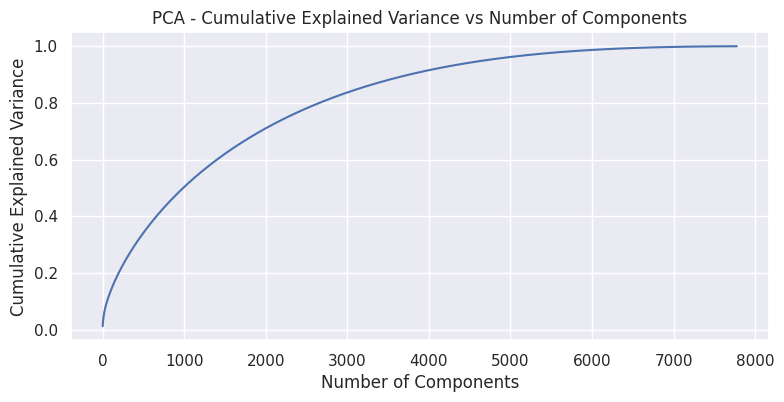

In [ ]:
# Explained variance for different number of components by plotting scree plot

plt.figure(figsize=(9,4))
plt.plot(np.cumsum(transformer.explained_variance_ratio_))
plt.title('PCA - Cumulative Explained Variance vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

From the above plot:
* About 7600 components account for 100% of the variance.

* Moreover, 4000 components alone can explain more than 90% of the variance.

* So, we can choose the top 4000 components of the model, which will still be able to capture more than 90% of variation, in order to simplify it and minimise its dimensionality.

90% of variance explained with 4000 components

In [ ]:
# Reducing the dimensions to 4000 using PCA
transformer = PCA(n_components=4000,random_state=0)
transformer.fit(array)

PCA(n_components=4000, random_state=0)

**Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)**

We have used PCA(Principal Component Analysis) technique for dimensionality reduction because It reduces the time and storage space required.

### 8. Data Transformation

In [ ]:
# Transform Your data
# Transformed features
X = transformer.transform(array)

In [ ]:
# Shape of the transfotmed vectors
X.shape

(7777, 4000)

## ***ML Model Implementation***

Unsupervised machine learning algorithms are permitted to identify patterns in the dataset without reference to a target label, in contrast to supervised machine learning, which fits a model to a dataset using a target label. Here we have used the two most commonly used models - **K-Means Clustering and Hierarchical Clustering algorithms**.

**Approach:**

* Use several algorithms to cluster the videos, then utilise various methods to achieve the ideal amount of clusters.
* Create the ideal amount of clusters, then use word clouds to show what each cluster contains.


### ML Model - 1 **(K-Means Clustering)**

Unsupervised learning algorithm K-Means Clustering divides the unlabeled dataset into various clusters. K indicates the quantity of pre-defined clusters in this case.

It gives us the ability to divide the data into various groups and provides a practical method for automatically identifying the groups in the unlabeled dataset without the need for any training.

Each cluster has a centroid assigned to it because the algorithm is centroid-based. This algorithm's primary goal is to reduce the total distances between each data point and its corresponding clusters.

**In order to determine the ideal number of clusters for the K-means Clustering Algorithm, the Elbow Plot and Silhouette score are visualised.**

**Elbow Method to get number of clusters**

Text(0, 0.5, 'WCSS')

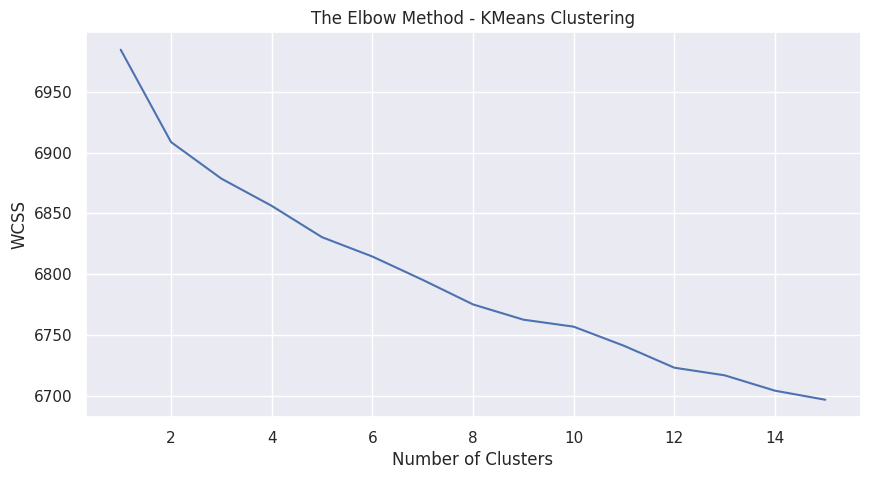

In [ ]:
# Elbow method to calculate the optimal value of K
# Take sum of square errors:
from sklearn.cluster import KMeans
wcss = [] 
for i in range(1,16): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)

# Now Plot the value of wcss

plt.figure(figsize=(10,5))
plt.plot(range(1,16),wcss)
plt.title('The Elbow Method - KMeans Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')

**Silhouette score for different number of clusters**

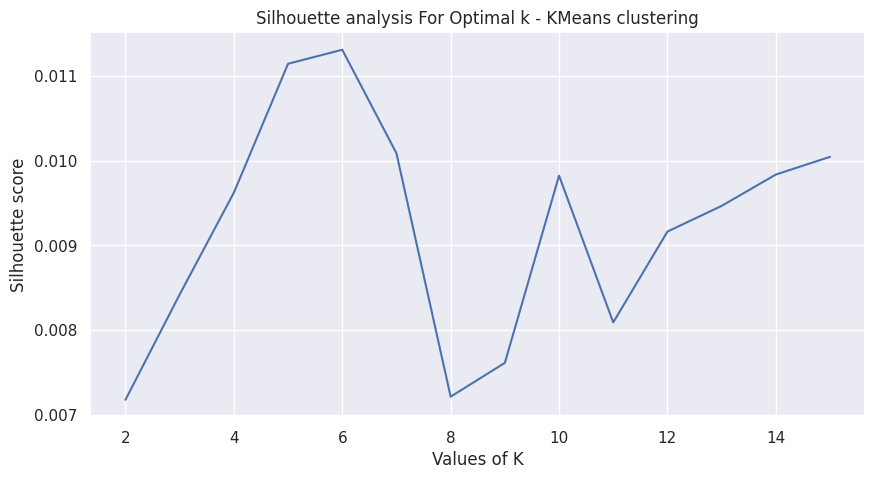

In [ ]:
#Plotting Silhouette score for different number of clusters
range_n_num_clusters = range(2,16)
silhouette_aveg = []
for num_clusters in range_n_num_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=0)
  kmeans.fit(X)
  cluster_labels = kmeans.labels_
 
  # silhouette score
  silhouette_aveg.append(silhouette_score(X, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_num_clusters,silhouette_aveg)
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.007177640709720665
For n_clusters = 3 The average silhouette_score is : 0.008397155947051833
For n_clusters = 4 The average silhouette_score is : 0.00885448955402344
For n_clusters = 5 The average silhouette_score is : 0.008770475081369626
For n_clusters = 6 The average silhouette_score is : 0.008662659373346116
For n_clusters = 7 The average silhouette_score is : 0.007824867789119852
For n_clusters = 8 The average silhouette_score is : 0.007772574181235898
For n_clusters = 9 The average silhouette_score is : 0.006909739517960324
For n_clusters = 10 The average silhouette_score is : 0.0072749669581912224


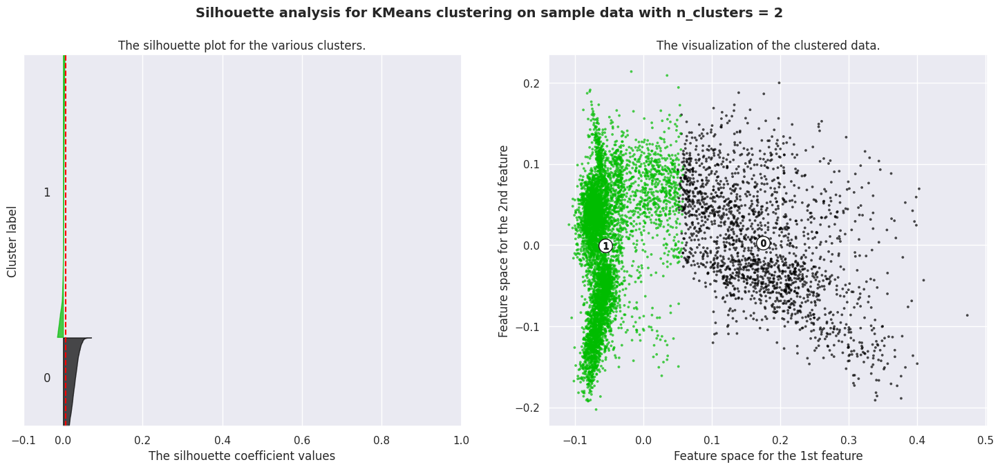

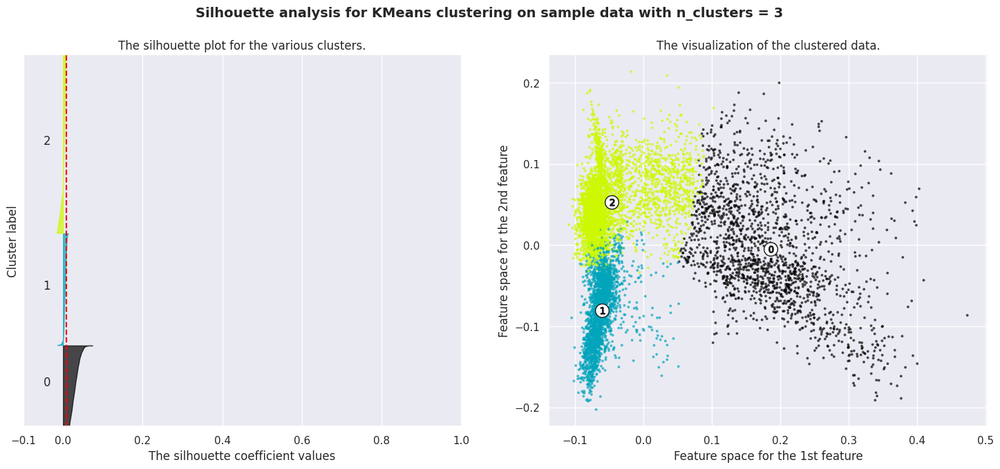

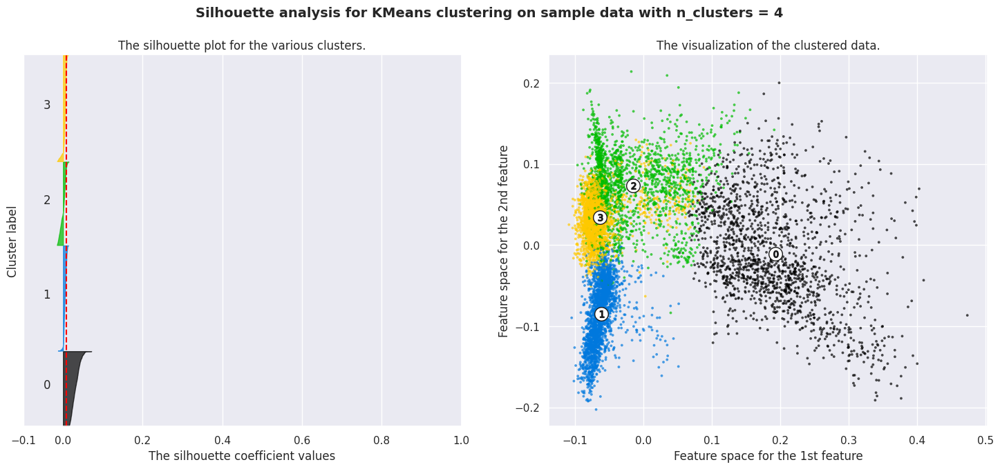

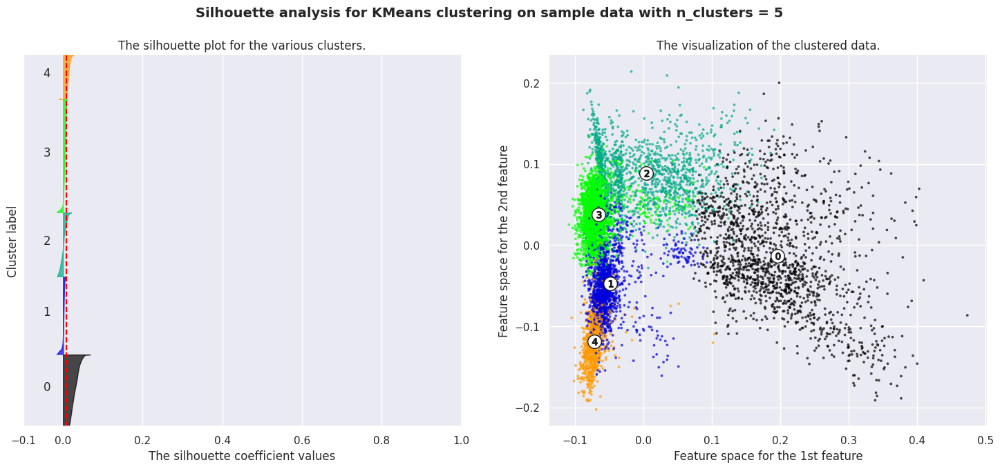

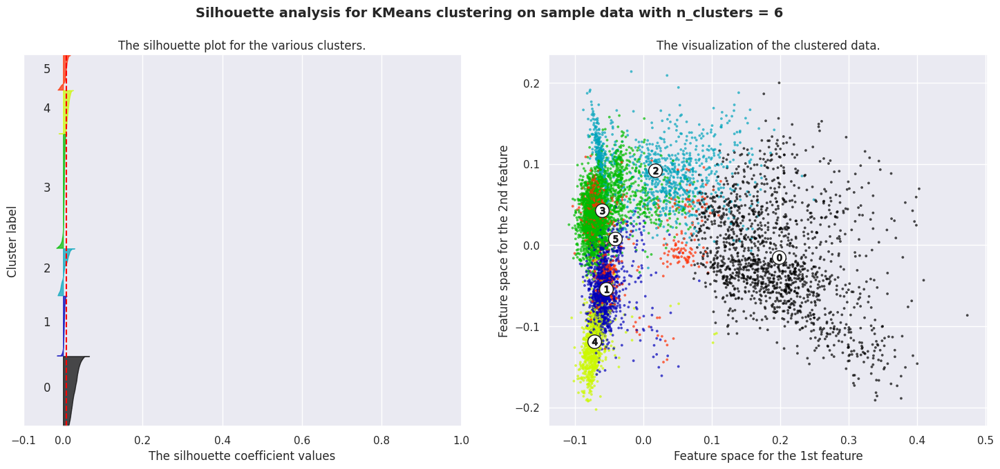

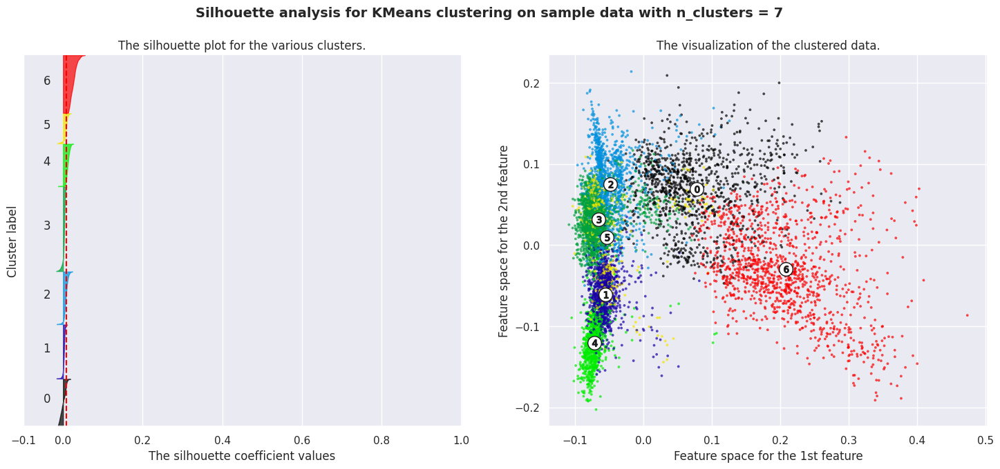

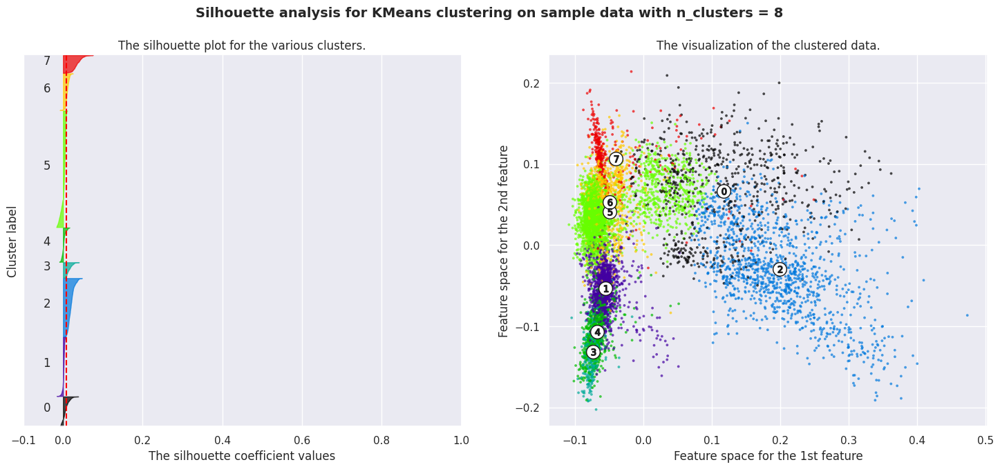

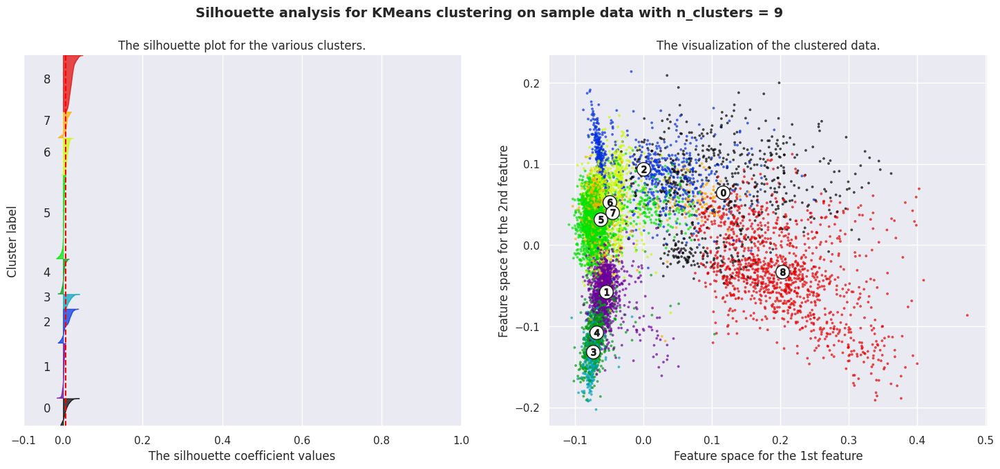

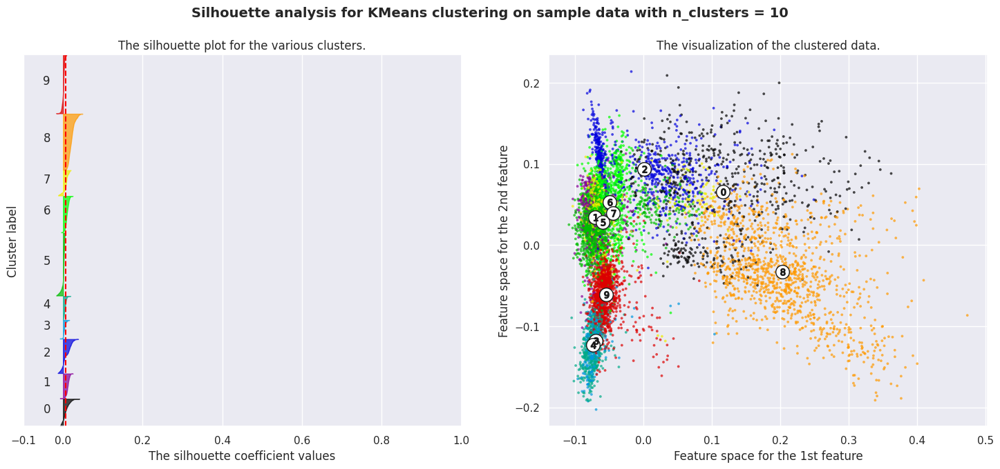

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
range_n_clusters = range(2,11)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

From the above plot, **the number of clusters is selected as 8. Let's build clusters using k=8.**


In [ ]:
# Now lets Clustering the data into 8 clusters
kmeans = KMeans(n_clusters=8, init='k-means++',random_state=0)
kmeans.fit(X)

KMeans(random_state=0)

In [ ]:
# Evaluation metrics - Distortion, Silhoutte score
kmeans_distortion = kmeans.inertia_
kmeans_silhoutte_scores = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion,kmeans_silhoutte_scores))

(6775.01488817863, 0.007213903075556861)


**Predicting**

In [ ]:
#predict the labels of clusters.
label = kmeans.fit_predict(X)

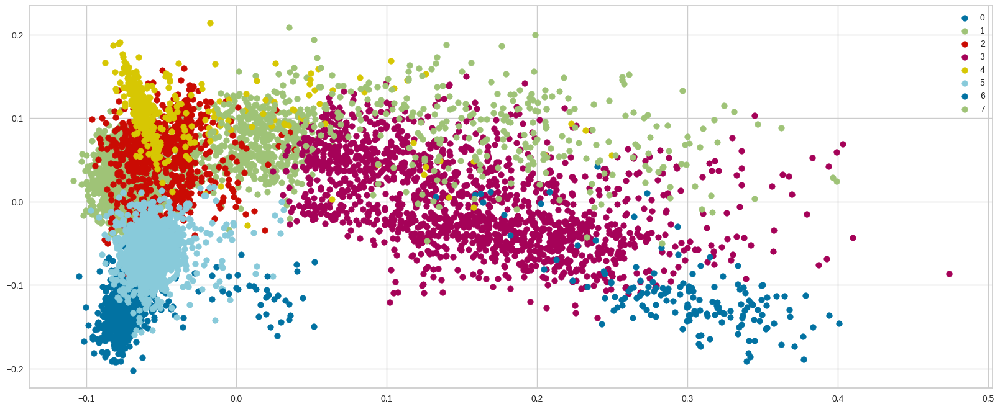

In [ ]:
#Getting unique labels
unq_labels = np.unique(label)
 
#plotting the results:
for i in unq_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.rcParams["figure.figsize"] = (20,8)
plt.legend()
plt.show()

In [ ]:
# Adding a kmeans cluster number attribute
df['kmeans_cluster'] = kmeans.labels_

In [ ]:
# checking how it is working
df.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,day_added,month_added,year_added,target_ages,count,filtered,kmeans_cluster
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,14,8,2020,Adults,1,"[future, elite, inhabit, island, paradise, far...",3
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,23,12,2016,Adults,1,"[devastating, earthquake, hits, mexico, city, ...",5
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",20,12,2018,Adults,1,"[army, recruit, found, dead, fellow, soldiers,...",5
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",16,11,2017,Teens,1,"[postapocalyptic, world, ragdoll, robots, hide...",1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,1,1,2020,Teens,1,"[brilliant, group, students, become, cardcount...",1


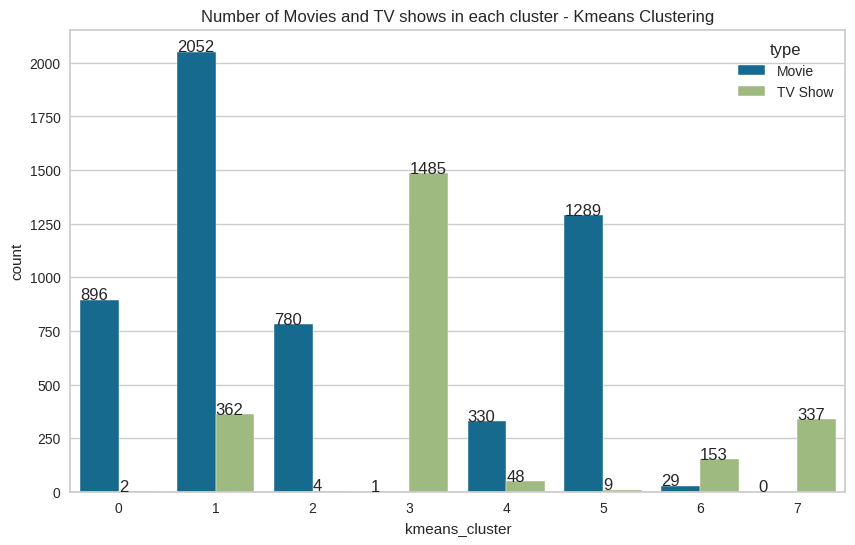

In [ ]:
# Check how many of movies and tv shows in each cluster.
plt.figure(figsize=(10,6))
q = sns.countplot(x='kmeans_cluster',data=df, hue='type')
plt.title('Number of Movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for i in q.patches:
   q.annotate(format(i.get_height(), '.0f'), (i.get_x(), i.get_height()))

**Building wordclouds for different clusters built**

A word cloud is a straightforward but effective visual representation object for text processing that displays the most common words in larger, bolder characters and in a variety of colours. Word clouds are especially useful for the following purposes:

Find the key themes or subjects in a vast body of literature quickly.

Recognize the overarching theme or tone of a written work.

Investigate any patterns or trends in data that include text.

Use compelling visuals to effectively communicate the main points or notions.



In [ ]:
# Building a wordcloud for the movies description.
def kmeans_worldcloud(cluster_number):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterating thru the csv file
  for val in df[df['kmeans_cluster']==cluster_number].description.values:
      
      # typecasting each value to string
      val = str(val)

      # split the values
      tokens = val.split()
      
      # Converts each token into lowercases
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


  # plot the WordCloud image                      
  plt.figure(figsize = (10,5), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)

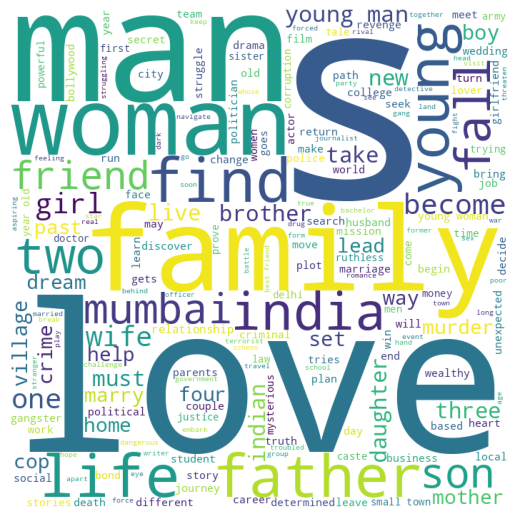

In [ ]:
#Now taking cluster 0 in worldcloud
kmeans_worldcloud(0)

**Keywords observed in the cluster number 0: love, man, woman, find,family etc**.


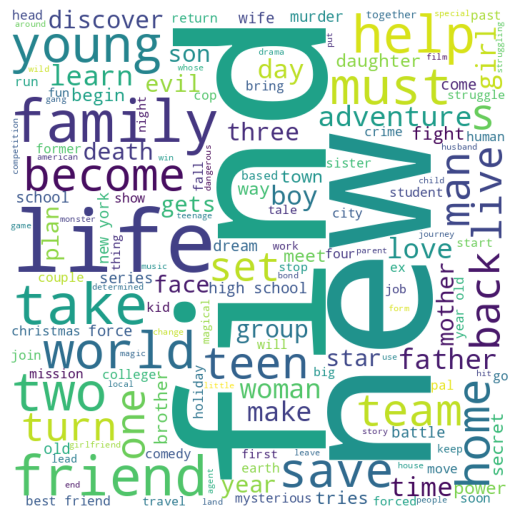

In [ ]:
#Now taking cluster 1 in worldcloud
kmeans_worldcloud(1)

**Keywords observed in the cluster number 1: new, life, family, find, friend, world etc.**

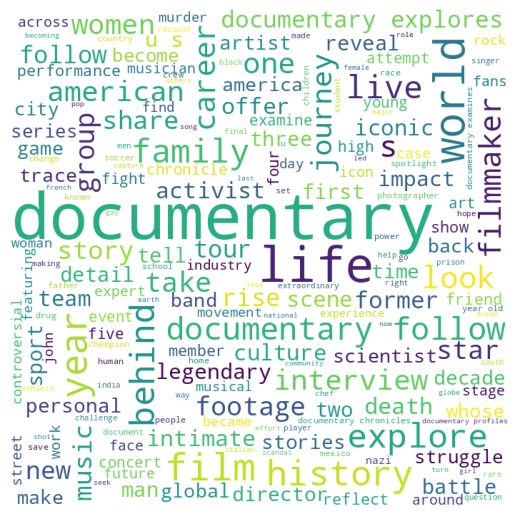

In [ ]:
#Now taking cluster 2 in worldcloud
kmeans_worldcloud(2)

**Keywords observed in the cluster number 2: documentry, life, history, world etc.**

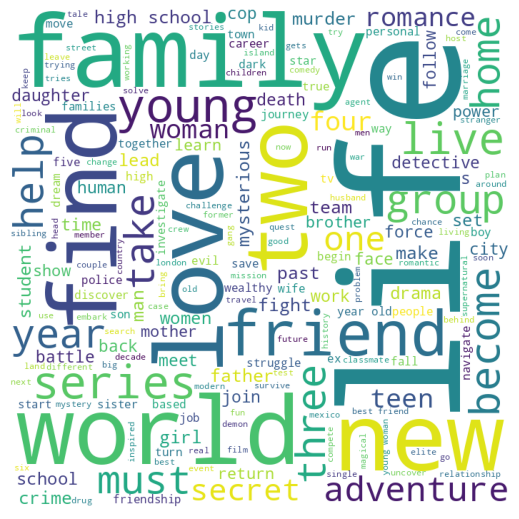

In [ ]:
#Now taking cluster 3 in worldcloud
kmeans_worldcloud(3)

**Keywords observed in the cluster number 3: family, life, world etc.**

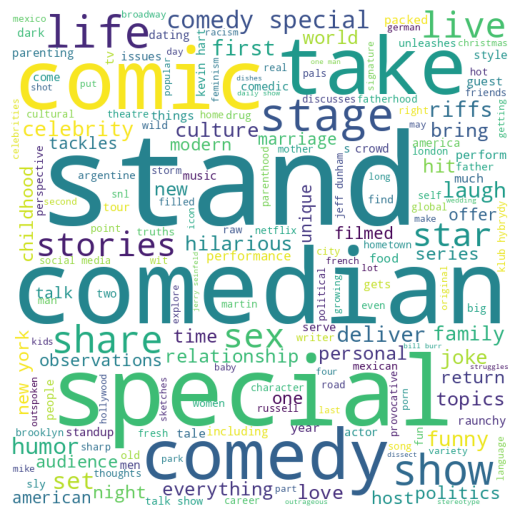

In [ ]:
#Now taking cluster 4 in worldcloud
kmeans_worldcloud(4)

**Keywords observed in the cluster number 4: special, stand, comedian, comic etc.**

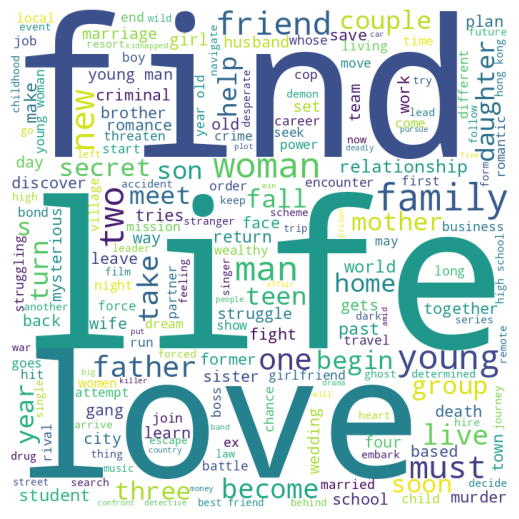

In [ ]:
#Now taking cluster 5 in worldcloud
kmeans_worldcloud(5)

**Keywords observed in the cluster number 5: life, find, woman, family etc.**

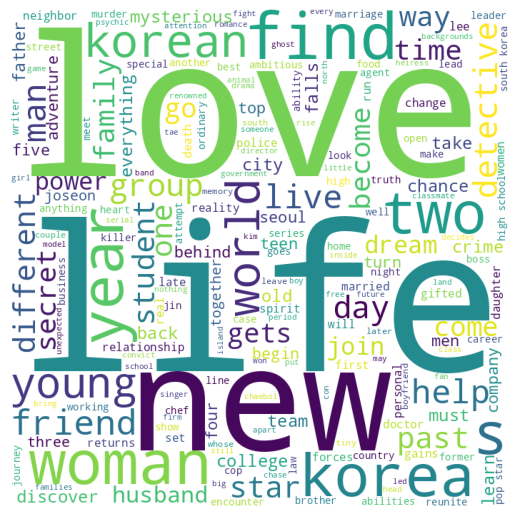

In [ ]:
#Now taking cluster 6 in worldcloud
kmeans_worldcloud(6)

**Keywords observed in the cluster number 6: new, life, find, love, korea, friend etc.**

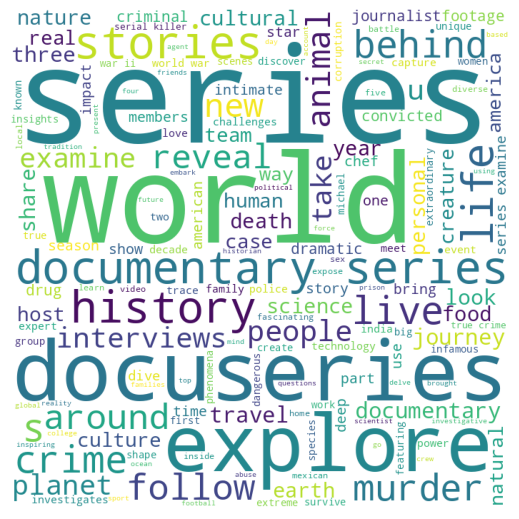

In [ ]:
#Now taking cluster 7 in worldcloud
kmeans_worldcloud(7)

**Keywords observed in the cluster number 7: explore, series, world, docuseries, murder etc.**

### ML Model - 2 **Hierarchical Clustering:**

Unsupervised machine learning clustering using hierarchical clustering. The dataset is grouped using tree-like morphologies as opposed to K-means clustering, and the clusters are organised into hierarchies using dendrograms.

**There two approaches:**
**Agglomerative and Divisive**

* **Agglomerative** - agglomerative is a bottom-up approach, in which the algorithm starts with taking all data points as single clusters and merging them until one cluster is left.

* **Divisive** - Divisive algorithm is the reverse of the agglomerative algorithm as it is a top-down approach.

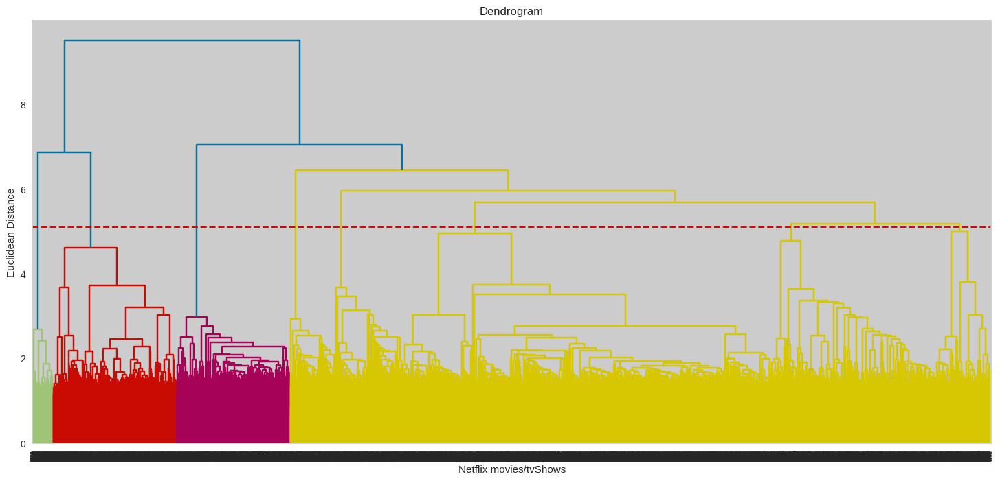

In [ ]:
#importing needed libraries
from scipy.cluster.hierarchy import linkage, dendrogram
# Building a dendogram to decide on the number of clusters
plt.figure(figsize=(18,8))  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix movies/tvShows')
plt.ylabel('Euclidean Distance')
plt.axhline(y= 5.1, color='r', linestyle='--')
plt.show()

**Observation: At a distance of 5.1 units, 8 clusters can be built using the agglomerative clustering algorithm**

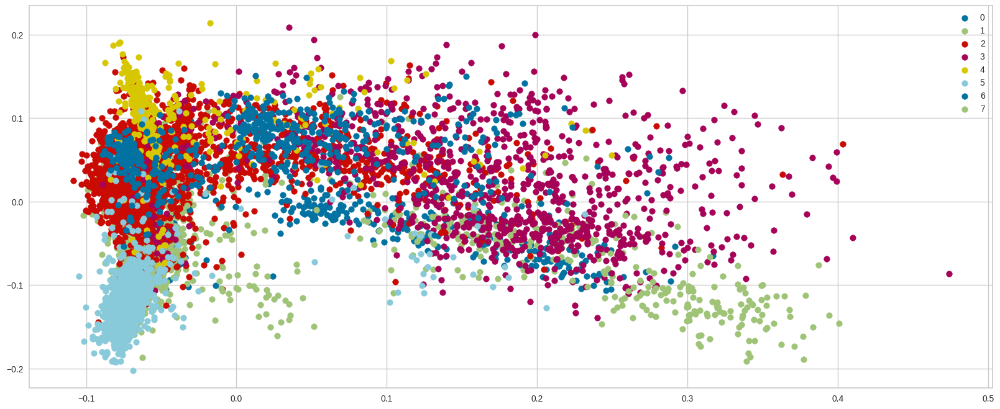

In [ ]:
# Fit the Algorithm
model = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='ward')
model.fit(X)

# Predict the labels of clusters
label = model.fit_predict(X)

# Getting unique labels
unique_labels = np.unique(label)
 
# Plotting the results

for i in unique_labels:
    plt.scatter(X[label == i , 0], X[label == i , 1], label = i)
plt.rcParams["figure.figsize"] = (20,8)
plt.legend()
plt.show()

In [ ]:
# Add cluster values to the dateframe
df['hierarchical_cluster'] = model.labels_

In [ ]:
# Calculate the silhouette_score:
silhouette_avg_score = silhouette_score(X, label)
print("The average silhouette_score is :", silhouette_avg_score)

The average silhouette_score is : 0.0033391140910936203


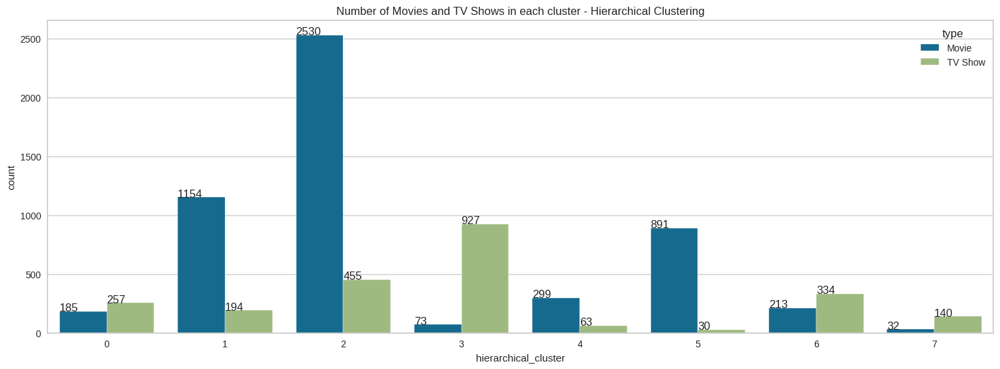

In [ ]:
# Number of movies and tv_shows in each cluster. as total number of cluster is 8
plt.figure(figsize=(18,6))
p = sns.countplot(x='hierarchical_cluster',data=df, hue='type')
plt.title('Number of Movies and TV Shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for i in p.patches:
   p.annotate(format(i.get_height(), '.0f'), (i.get_x(), i.get_height()))

**Successfully built 8 clusters using the Agglomerative (hierarchical) clustering algorithm.**


**Building wordclouds for different clusters built:**

A word cloud is a straightforward yet effective visual representation tool for text processing that displays the most frequent words in larger, bolder characters and in a variety of colours.

Wordclouds can be particularly helpful when we want to:
* Find the key themes or subjects in a vast body of literature quickly.
* Recognize the overarching theme or tone of a written work.
* Investigate any patterns or trends in data that include text.
* Provide the main thoughts or ideas in a visually appealing manner.


In [ ]:
#ML
# Building a wordcloud for the movie descriptions
def func_hierarchical_clust_worldcloud(cluster_number):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterating through the csv file
  for value in df[df['hierarchical_cluster']==cluster_number].description.values:
      
      # typecaste each value to string
      value = str(value)

      # split the value
      tokens = value.split()
      
      # Converts each token into lowercase
      for j in range(len(tokens)):
          tokens[j] = tokens[j].lower()
      
      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


  # plot the WordCloud image                      
  plt.figure(figsize = (11,6), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)

**Now lets check the cluster 0 to 7. As we have total 8 clusters**

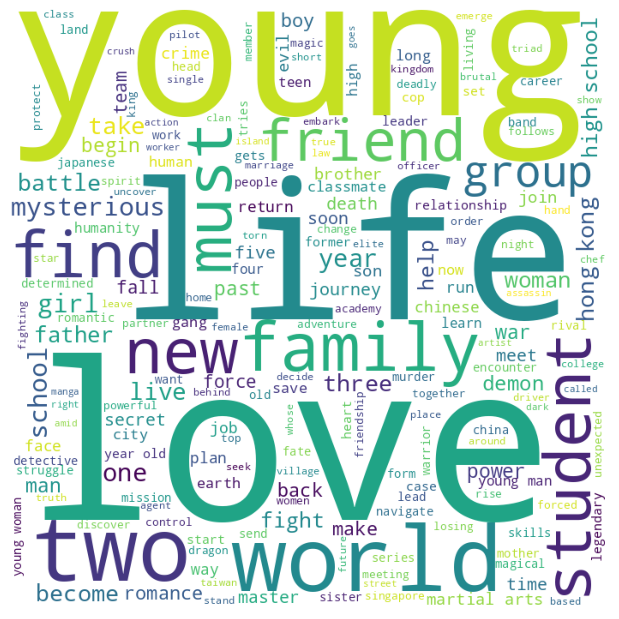

In [ ]:
# Wordcloud for cluster 0
func_hierarchical_clust_worldcloud(0)

**Keywords observed in cluster 0: life love, young, world etc**


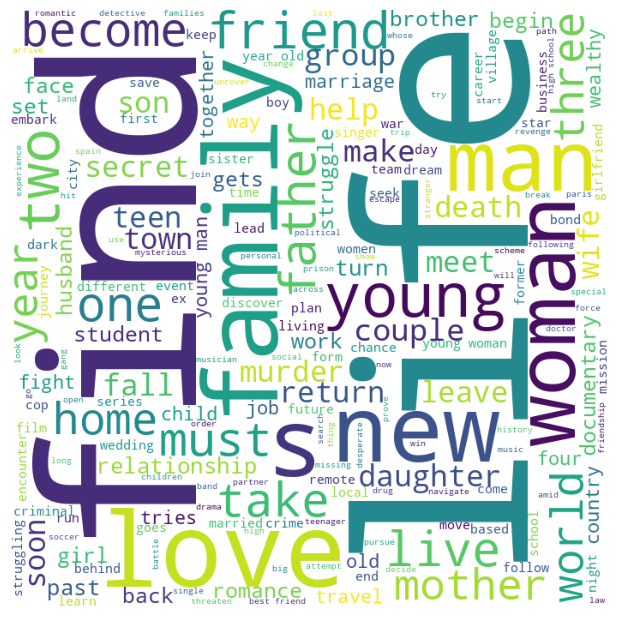

In [ ]:
# Wordcloud for cluster 1
func_hierarchical_clust_worldcloud(1)

**Keywords observed in cluster 1:  etc**

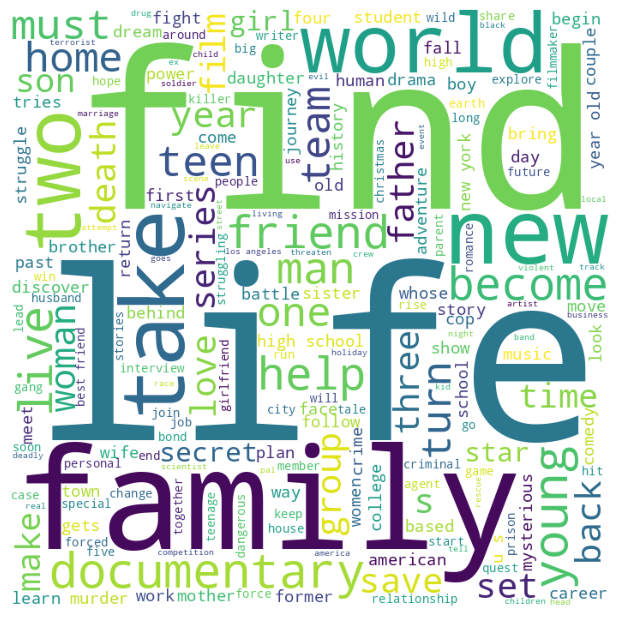

In [ ]:
# Wordcloud for cluster 2
func_hierarchical_clust_worldcloud(2)

**Keywords observed in cluster 2:  etc**

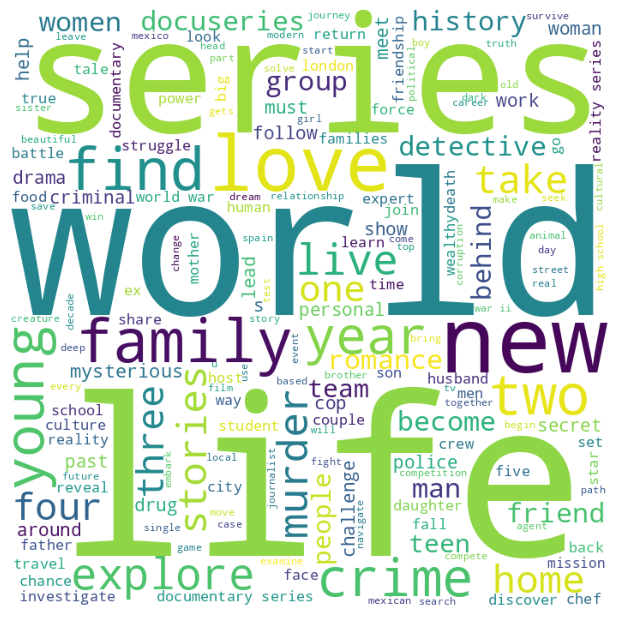

In [ ]:
# Wordcloud for cluster 3
func_hierarchical_clust_worldcloud(3)

**Keywords observed in cluster 3: life, murder, series, crime, world etc**

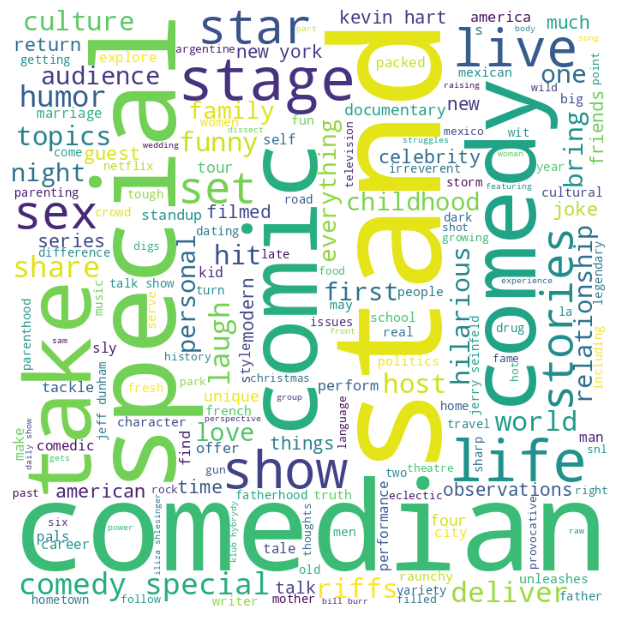

In [ ]:
# Wordcloud for cluster 4
func_hierarchical_clust_worldcloud(4)

**Keywords observed in cluster 4: comic, stand, special, humour, comedian  etc**

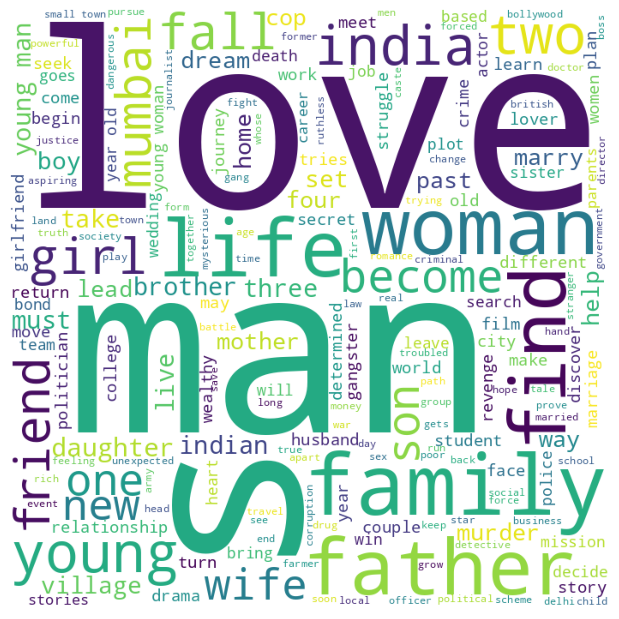

In [ ]:
# Wordcloud for cluster 5
func_hierarchical_clust_worldcloud(5)

**Keywords observed in cluster 5: man, love, india, friend  etc**

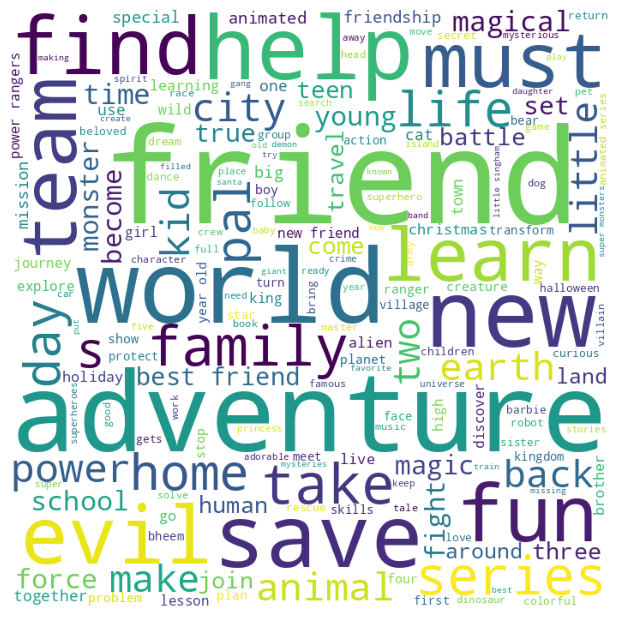

In [ ]:
# Wordcloud for cluster 6
func_hierarchical_clust_worldcloud(6)

**Keywords observed in cluster 6: adventure, evil, fun, friend, team, help  etc**

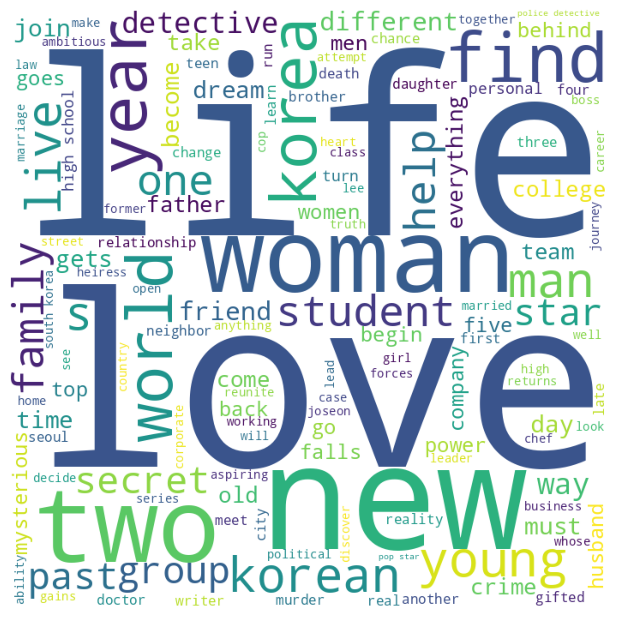

In [ ]:
# Wordcloud for cluster 7
func_hierarchical_clust_worldcloud(7)

**Keywords observed in cluster 7: new, life, love, korea, two, year etc**

## **ML Model - 3  Content Based Recommender System:**

Machine learning algorithms called recommender systems offer "appropriate" recommendations to customers. This recommender system is utilised to give us appropriate results when we search for something anywhere, whether it's in an app or our search engine. Based on their descriptions, it determines whether products are similar to one another and suggests goods to clients.

In [ ]:
# defining a recommender df for building a recommender system
df_recommender= df.copy()

In [ ]:
df_recommender.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'day_added', 'month_added', 'year_added', 'target_ages', 'count',
       'filtered', 'kmeans_cluster', 'hierarchical_cluster'],
      dtype='object')

In [ ]:
# Nowe we have to reset the index
df_recommender.reset_index(inplace=True)

# checking reset index 
df_recommender[['show_id', 'director', 'filtered']]

,show_id,director,filtered
0,s1,Unknown,"[future, elite, inhabit, island, paradise, far..."
1,s2,Jorge Michel Grau,"[devastating, earthquake, hits, mexico, city, ..."
2,s3,Gilbert Chan,"[army, recruit, found, dead, fellow, soldiers,..."
3,s4,Shane Acker,"[postapocalyptic, world, ragdoll, robots, hide..."
4,s5,Robert Luketic,"[brilliant, group, students, become, cardcount..."
...,...,...,...
7772,s7783,Josef Fares,"[lebanons, civil, war, deprives, zozo, family,..."
7773,s7784,Mozez Singh,"[scrappy, poor, boy, worms, way, tycoons, dysf..."
7774,s7785,Unknown,"[documentary, south, african, rapper, nasty, c..."
7775,s7786,Unknown,"[dessert, wizard, adriano, zumbo, looks, next,..."


In [ ]:
# Now we have to drop the show-id and index column
df_recommender.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
# Now called the transformed array after performing PCA for dimenssionality reduction i.e
X

array([[ 0.15226516, -0.01802017,  0.00170783, ..., -0.00468108,
         0.00083254, -0.00145273],
       [-0.04909761, -0.03720961,  0.02756254, ...,  0.00139658,
         0.00067001, -0.00029162],
       [-0.06202184, -0.03720611,  0.00163765, ...,  0.01322419,
         0.01235265, -0.0059576 ],
       ...,
       [-0.02335309,  0.02408429,  0.0007723 , ...,  0.01036539,
        -0.00161   ,  0.00098362],
       [ 0.10785421,  0.00441647, -0.02167688, ...,  0.00387794,
         0.00150745, -0.00826161],
       [-0.04952346,  0.15763068, -0.06309894, ...,  0.00835625,
        -0.00138192, -0.00369525]])

In [ ]:
# now calculating the cosine similarity of X
similarity_cos = cosine_similarity(X)
similarity_cos

array([[ 1.        ,  0.08957728,  0.0142981 , ..., -0.00921462,
         0.01692808, -0.01729046],
       [ 0.08957728,  1.        ,  0.00134418, ...,  0.0434527 ,
        -0.00638144, -0.01086215],
       [ 0.0142981 ,  0.00134418,  1.        , ..., -0.00259826,
        -0.00882022, -0.01898833],
       ...,
       [-0.00921462,  0.0434527 , -0.00259826, ...,  1.        ,
        -0.00622228,  0.08694714],
       [ 0.01692808, -0.00638144, -0.00882022, ..., -0.00622228,
         1.        , -0.01613426],
       [-0.01729046, -0.01086215, -0.01898833, ...,  0.08694714,
        -0.01613426,  1.        ]])

**Now let we define a function that will contain the list of top 15 recommended movies on the basis of cosine similarity score.**


In [ ]:
def recommend_movie(movie):
  try:
    '''
    This function will list the top 15 movies on the basis of cosine similarity score for that particular movie.
    '''
    # Empty list
    recommend_contents = []   
    # find out index position
    indexes = df_recommender[df_recommender['title'] == movie].index[0]

    # Now sorting on the basis of the cosine silimlirity score
    distances = sorted(list(enumerate(similarity_cos[indexes])), reverse=True, key=lambda x:x[1])
    # printing Statement
    print(f"If you liked the'{movie}', you may also enjoy it: \n")

    # listing top fifteen
    for i in distances[1:16]:
      recommend_contents.append(df_recommender.iloc[i[0]].title)
    return recommend_contents
  except:
     return 'Invalid Entry'

In [ ]:
# checking Recommendations for 'Lucifier '
recommend_movie('Lucifer')

If you liked the'Lucifer', you may also enjoy it: 



['Rica, Famosa, Latina',
 'Tom Segura: Completely Normal',
 'On My Block',
 'Girlfriends',
 'Beauty & the Beast',
 'The Break',
 'Sister Cities',
 "Monty Python's Fliegender Zirkus",
 'Behzat Ç.',
 "Droppin' Cash: Los Angeles",
 'My Holo Love',
 'Chef',
 'Bottom of the World',
 'Jackie: A Tale of Two Sisters',
 'NSU German History X']

In [ ]:
# checking Recommendations for 'GoldenEye'
recommend_movie('GoldenEye')

If you liked the'GoldenEye', you may also enjoy it: 



['Tomorrow Never Dies',
 'The World Is Not Enough',
 'Die Another Day',
 'The Foreigner',
 'Eurovision Song Contest: The Story of Fire Saga',
 "Dante's Peak",
 'Quantum of Solace',
 'Casino Royale',
 'Remember Me',
 'My Week with Marilyn',
 'Rounders',
 'Océans',
 "I Don't Know How She Does It",
 'The Frankenstein Chronicles',
 'Command and Control']

In [ ]:
# checking Recommendations for 'Mind Game'
recommend_movie('Mind Game')

If you liked the'Mind Game', you may also enjoy it: 



['La Femme',
 'The Dream Catchers',
 'The Ultimatum',
 'The Truth',
 'Bountiful Blessings',
 'Unriddle',
 'The Golden Path',
 'Against the Tide',
 'World at Your Feet',
 'The Family Court',
 'Handsome Siblings',
 'Tunnel',
 'The Defected',
 'La Mante',
 'Anjaan: Special Crimes Unit']

In [ ]:
# checking Recommendations for 'Article 15 '
recommend_movie('Article 15')

If you liked the'Article 15', you may also enjoy it: 



['No One Killed Jessica',
 'Ginny Weds Sunny',
 'One Day: Justice Delivered',
 'Raja Natwarlal',
 'Little Singham: Kaal Ka Badla',
 'Rukh',
 'Penalty',
 'Har Kisse Ke Hisse: Kaamyaab',
 'Manusangada',
 'Singh Saab the Great',
 'Phantom',
 'Aiyaary',
 'Life of An Outcast',
 'Zero',
 'Raees']

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

* ***It was interesting to find that majority of the content available on Netflix is Movies.***
* ***But in the recent years it has been focusing more on Tv-Shows.***
* ***Most of these contents are released either in the year ending or the beginning.***
* ***United States and India are among the top 5 countries that produce all of the available content on the platform.***
* ***Also 6 of the actors among the top ten actors with maximum content are from India.***   
* ***TV-MA tops the charts, indicating that mature content is more popular on Netflix.***
* ***k=8 was found to be an optimal value for clusters using which we grouped our data into 8 distinct clusters.***
* ***Using the given data a simple recommender system was created using cosine_similarity and recommendations for Movies and Tv Shows were obtained.***


# **Future Scope:**

* ***Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.***
* ***More time could be given into building a better recommender system, which later can be deployed on web for usage.***
